In [42]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
import os
import glob
import pandas as pd
from pathlib import Path

# Add alternative audio loading libraries
try:
    import librosa
    HAS_LIBROSA = True
except ImportError:
    HAS_LIBROSA = False
    print("librosa not found. Will use scipy.io.wavfile only (limited format support).")
    print("Consider installing librosa for broader audio format support: pip install librosa")

# Configuration parameters
CONFIG = {
    'chirp_min_freq': 18000,      # Hz
    'chirp_max_freq': 22000,      # Hz
    'chirp_duration_ms': 20,      # ms
    'speed_of_sound': 343,        # m/s
    'search_window_start': 1.0,   # ms - adjust based on the closest expected distance
    'search_window_end': 8.0,     # ms - adjust for the furthest expected distance
    'plot_results': True,         # Set to True to visualize results
    'debug_mode': True            # Enable detailed debug output
}

class EchoValidator:
    """Class for validating echo detection in acoustic sensing data"""
    
    def __init__(self, config):
        """Initialize with configuration parameters"""
        self.config = config
        self.sample_rate = None
        self.chirp_template = None
    
    def generate_chirp_template(self, sample_rate):
        """Generate chirp template based on configuration"""
        self.sample_rate = sample_rate
        
        # Calculate chirp parameters
        chirp_samples = int(sample_rate * self.config['chirp_duration_ms'] / 1000.0)
        chirp_rate = (self.config['chirp_max_freq'] - self.config['chirp_min_freq']) / (self.config['chirp_duration_ms'] / 1000.0)
        
        # Generate time vector
        t = np.arange(chirp_samples) / sample_rate
        
        # Apply Hamming window
        window = np.hamming(chirp_samples)
        
        # Generate linear chirp
        phase = 2 * np.pi * (self.config['chirp_min_freq'] * t + 0.5 * chirp_rate * t * t)
        amplitude = window  # Normalized amplitude
        self.chirp_template = amplitude * np.sin(phase)
        
        if self.config['debug_mode']:
            print(f"Generated chirp template: {len(self.chirp_template)} samples")
            if self.config['plot_results']:
                plt.figure(figsize=(10, 6))
                plt.subplot(2, 1, 1)
                plt.plot(t * 1000, self.chirp_template)  # Time in ms
                plt.title("Chirp Template")
                plt.xlabel("Time (ms)")
                plt.ylabel("Amplitude")
                plt.grid(True)
                
                plt.subplot(2, 1, 2)
                f, t, Sxx = signal.spectrogram(self.chirp_template, sample_rate, nperseg=256, noverlap=128)
                plt.pcolormesh(t * 1000, f / 1000, 10 * np.log10(Sxx + 1e-10), shading='gouraud')
                plt.title("Chirp Spectrogram")
                plt.ylabel('Frequency (kHz)')
                plt.xlabel('Time (ms)')
                plt.colorbar(label='Power (dB)')
                plt.tight_layout()
                plt.show()
        
        return self.chirp_template
    
    def apply_bandpass_filter(self, audio_data):
        """Apply bandpass filter to isolate the chirp frequency range"""
        nyquist = self.sample_rate / 2
        low = self.config['chirp_min_freq'] / nyquist
        high = self.config['chirp_max_freq'] / nyquist
        
        # Use an 8th order Butterworth filter
        b, a = signal.butter(8, [low, high], btype='band')
        filtered_data = signal.filtfilt(b, a, audio_data)
        
        if self.config['debug_mode']:
            print(f"Applied bandpass filter ({self.config['chirp_min_freq']}-{self.config['chirp_max_freq']} Hz)")
        
        return filtered_data
    
    def detect_chirps(self, audio_data, threshold=0.5):
        """
        Detect chirps in the audio data
        
        Args:
            audio_data: Audio signal
            threshold: Detection threshold (0-1)
            
        Returns:
            List of detected chirp start positions (in samples)
        """
        # Use cross-correlation with the chirp template
        correlation = signal.correlate(audio_data, self.chirp_template, mode='valid')
        correlation = correlation / (np.std(audio_data) * np.std(self.chirp_template) * len(self.chirp_template))
        
        # Find peaks in correlation
        # Determine threshold based on correlation statistics
        if threshold < 0:
            # Automatic threshold based on statistics
            threshold = np.mean(correlation) + 3 * np.std(correlation)
        else:
            # Scale threshold based on correlation range
            threshold = threshold * np.max(correlation)
        
        peaks, _ = signal.find_peaks(correlation, height=threshold, distance=int(self.sample_rate * 0.1))
        
        if self.config['debug_mode']:
            print(f"Detected {len(peaks)} chirps using threshold {threshold:.4f}")
            
            if self.config['plot_results']:
                plt.figure(figsize=(12, 6))
                t = np.arange(len(correlation)) / self.sample_rate
                plt.plot(t, correlation)
                plt.plot(t[peaks], correlation[peaks], 'ro')
                plt.axhline(y=threshold, color='r', linestyle='-', alpha=0.3)
                plt.title("Chirp Detection")
                plt.xlabel("Time (s)")
                plt.ylabel("Correlation")
                plt.grid(True)
                plt.show()
        
        return peaks
    
    def extract_profiles(self, audio_data, chirp_positions, profile_duration_ms=100):
        """
        Extract profiles around each chirp
        
        Args:
            audio_data: Audio signal
            chirp_positions: List of chirp positions in samples
            profile_duration_ms: Duration of each profile in ms
            
        Returns:
            List of profiles (numpy arrays)
        """
        profiles = []
        samples_per_profile = int(self.sample_rate * profile_duration_ms / 1000)
        
        for pos in chirp_positions:
            # Extract profile ensuring we don't go out of bounds
            if pos + samples_per_profile <= len(audio_data):
                profile = audio_data[pos:pos + samples_per_profile]
                profiles.append(profile)
        
        if self.config['debug_mode']:
            print(f"Extracted {len(profiles)} profiles of {samples_per_profile} samples each")
            
            if self.config['plot_results'] and profiles:
                # Plot a few example profiles
                num_to_plot = min(5, len(profiles))
                plt.figure(figsize=(12, 10))
                
                for i in range(num_to_plot):
                    plt.subplot(num_to_plot, 1, i+1)
                    t = np.arange(len(profiles[i])) / self.sample_rate * 1000  # Time in ms
                    plt.plot(t, profiles[i])
                    plt.title(f"Profile {i}")
                    plt.xlabel("Time (ms)")
                    plt.ylabel("Amplitude")
                    plt.grid(True)
                plt.tight_layout()
                plt.show()
        
        return profiles
    
    def detect_echo(self, profile):
        """
        Detect echo in a single profile
        
        Args:
            profile: Single profile array
            
        Returns:
            delay_time: Time delay in seconds
            distance: Estimated distance in cm
            confidence: Detection confidence (0-1)
        """
        # Define search window in samples
        search_start = int(self.config['search_window_start'] * self.sample_rate / 1000)
        search_end = int(self.config['search_window_end'] * self.sample_rate / 1000)
        search_end = min(search_end, len(profile))
        
        # Focus on the search window
        search_region = profile[search_start:search_end]
        
        # Use normalized cross-correlation for better peak detection
        correlation = signal.correlate(search_region, self.chirp_template, mode='valid')
        if np.std(search_region) > 0 and np.std(self.chirp_template) > 0:
            norm_factor = np.std(search_region) * np.std(self.chirp_template) * len(self.chirp_template)
            correlation = correlation / norm_factor
        
        if len(correlation) == 0:
            return 0, 0, 0  # No correlation could be computed
        
        # Find the peak
        peak_idx = np.argmax(correlation)
        peak_value = correlation[peak_idx]
        
        # Calculate time delay (adjust for search window offset)
        delay_samples = search_start + peak_idx
        delay_time = delay_samples / self.sample_rate
        
        # Calculate distance (divide by 2 for round trip)
        distance = self.config['speed_of_sound'] * delay_time / 2 * 100  # cm
        
        # Calculate a confidence metric based on peak value and SNR
        noise_level = np.mean(np.abs(correlation))
        snr = peak_value / noise_level if noise_level > 0 else 0
        confidence = min(1.0, snr / 10)  # Scale to 0-1, cap at 1.0
        
        return delay_time, distance, confidence
    
    def analyze_profiles(self, profiles):
        """
        Analyze multiple profiles to estimate distance
        
        Args:
            profiles: List of profiles
            
        Returns:
            DataFrame with results for each profile
        """
        results = []
        
        for i, profile in enumerate(profiles):
            delay_time, distance, confidence = self.detect_echo(profile)
            results.append({
                'profile_idx': i,
                'delay_time_ms': delay_time * 1000,
                'distance_cm': distance,
                'confidence': confidence
            })
        
        results_df = pd.DataFrame(results)
        
        if self.config['debug_mode']:
            print("\nDistance measurement results:")
            print(f"Mean distance: {results_df['distance_cm'].mean():.2f} cm")
            print(f"Median distance: {results_df['distance_cm'].median():.2f} cm")
            print(f"Std deviation: {results_df['distance_cm'].std():.2f} cm")
            print(f"Min distance: {results_df['distance_cm'].min():.2f} cm")
            print(f"Max distance: {results_df['distance_cm'].max():.2f} cm")
            
            if self.config['plot_results']:
                plt.figure(figsize=(12, 10))
                
                # Plot distance estimates
                plt.subplot(3, 1, 1)
                plt.plot(results_df['profile_idx'], results_df['distance_cm'], '.-')
                plt.axhline(y=results_df['distance_cm'].median(), color='r', linestyle='--')
                plt.title("Distance Estimates")
                plt.xlabel("Profile Index")
                plt.ylabel("Distance (cm)")
                plt.grid(True)
                
                # Plot delay times
                plt.subplot(3, 1, 2)
                plt.plot(results_df['profile_idx'], results_df['delay_time_ms'], '.-')
                plt.title("Echo Delay Times")
                plt.xlabel("Profile Index")
                plt.ylabel("Delay (ms)")
                plt.grid(True)
                
                # Plot confidence
                plt.subplot(3, 1, 3)
                plt.plot(results_df['profile_idx'], results_df['confidence'], '.-')
                plt.title("Detection Confidence")
                plt.xlabel("Profile Index")
                plt.ylabel("Confidence (0-1)")
                plt.grid(True)
                
                plt.tight_layout()
                plt.show()
                
                # Plot histogram of distance estimates
                plt.figure(figsize=(10, 6))
                plt.hist(results_df['distance_cm'], bins=20, alpha=0.7)
                plt.axvline(x=results_df['distance_cm'].median(), color='r', linestyle='--', 
                           label=f"Median: {results_df['distance_cm'].median():.2f} cm")
                plt.title("Distribution of Distance Estimates")
                plt.xlabel("Distance (cm)")
                plt.ylabel("Frequency")
                plt.legend()
                plt.grid(True)
                plt.show()
                
                
                
        
        return results_df
    
    def analyze_recording(self, file_path, expected_distance=None):
        """
        Analyze a complete recording file
        
        Args:
            file_path: Path to audio file
            expected_distance: Expected distance in cm (if known)
            
        Returns:
            Dictionary with analysis results
        """
        print(f"\nAnalyzing file: {os.path.basename(file_path)}")
        
        try:
            # Try multiple methods to load the audio file
            audio_loaded = False
            
            # Method 1: Try standard wavfile.read
            try:
                sample_rate, audio_data = wavfile.read(file_path)
                audio_loaded = True
                print(f"Loaded audio using scipy.io.wavfile")
            except Exception as e:
                print(f"Could not load with scipy.io.wavfile: {str(e)}")
            
            # Method 2: Try librosa if available
            if not audio_loaded and HAS_LIBROSA:
                try:
                    audio_data, sample_rate = librosa.load(file_path, sr=None, mono=True)
                    audio_loaded = True
                    print(f"Loaded audio using librosa")
                except Exception as e:
                    print(f"Could not load with librosa: {str(e)}")
            
            # Method 3: Try reading as raw PCM data
            if not audio_loaded:
                try:
                    print("Attempting to read as raw PCM data...")
                    # Assuming 16-bit signed integer at 48kHz
                    sample_rate = 48000
                    with open(file_path, 'rb') as f:
                        # Skip WAV header (44 bytes) if it exists
                        header = f.read(44)
                        # Read the rest as 16-bit signed integers
                        audio_bytes = f.read()
                        audio_data = np.frombuffer(audio_bytes, dtype=np.int16)
                    audio_loaded = True
                    print(f"Loaded audio as raw PCM data: {len(audio_data)} samples at {sample_rate} Hz (assumed)")
                except Exception as e:
                    print(f"Could not load as raw PCM: {str(e)}")
            
            if not audio_loaded:
                raise ValueError("Could not load audio file with any available method")
            
            # Convert to mono if stereo
            if len(audio_data.shape) > 1:
                audio_data = audio_data[:, 0]  # Use the first channel
            
            print(f"Loaded audio: {len(audio_data)} samples at {sample_rate} Hz")
            
            # Normalize to float in range -1 to 1
            audio_data = audio_data.astype(float) / np.max(np.abs(audio_data))
            
            # Generate chirp template if needed
            if self.chirp_template is None or self.sample_rate != sample_rate:
                self.generate_chirp_template(sample_rate)
            
            # Apply bandpass filter
            filtered_audio = self.apply_bandpass_filter(audio_data)
            
            # Detect chirps
            chirp_positions = self.detect_chirps(filtered_audio)
            
            if not chirp_positions.size:
                print("No chirps detected in the recording")
                return None
            
            # Extract profiles
            profiles = self.extract_profiles(filtered_audio, chirp_positions)
            
            if not profiles:
                print("No valid profiles extracted")
                return None
            
            # Analyze profiles
            results_df = self.analyze_profiles(profiles)
            debug_echo_detection(profiles, sample_rate, 20)
            
            
            
            # Calculate error metrics
            if expected_distance is not None:
                error = results_df['distance_cm'] - expected_distance
                results_df['error_cm'] = error
                
                print("\nError metrics:")
                print(f"Mean error: {error.mean():.2f} cm")
                print(f"Median error: {error.median():.2f} cm")
                print(f"Mean absolute error: {error.abs().mean():.2f} cm")
                print(f"Root mean square error: {np.sqrt((error**2).mean()):.2f} cm")
                
                if self.config['plot_results']:
                    plt.figure(figsize=(10, 6))
                    plt.plot(results_df['profile_idx'], error, '.-')
                    plt.axhline(y=0, color='r', linestyle='--')
                    plt.title(f"Distance Error (Expected: {expected_distance} cm)")
                    plt.xlabel("Profile Index")
                    plt.ylabel("Error (cm)")
                    plt.grid(True)
                    plt.show()
            
            # Prepare summary results
            summary = {
                'file_name': os.path.basename(file_path),
                'num_profiles': len(profiles),
                'mean_distance_cm': results_df['distance_cm'].mean(),
                'median_distance_cm': results_df['distance_cm'].median(),
                'std_dev_cm': results_df['distance_cm'].std(),
                'min_distance_cm': results_df['distance_cm'].min(),
                'max_distance_cm': results_df['distance_cm'].max()
            }
            
            if expected_distance is not None:
                summary['expected_distance_cm'] = expected_distance
                summary['mean_error_cm'] = error.mean()
                summary['median_error_cm'] = error.median()
                summary['mean_abs_error_cm'] = error.abs().mean()
                summary['rmse_cm'] = np.sqrt((error**2).mean())
            
            return summary
            
        except Exception as e:
            print(f"Error analyzing file {file_path}: {str(e)}")
            return None

    def visualize_echo_detection(self, profile, save_path=None):
        """
        Visualize the echo detection process for a single profile
        
        Args:
            profile: Single profile array
            save_path: Optional path to save the figure
        """
        # Define search window in samples
        search_start = int(self.config['search_window_start'] * self.sample_rate / 1000)
        search_end = int(self.config['search_window_end'] * self.sample_rate / 1000)
        search_end = min(search_end, len(profile))
        
        # Create time vector (in ms)
        t = np.arange(len(profile)) / self.sample_rate * 1000
        
        # Focus on the search window
        search_region = profile[search_start:search_end]
        t_search = t[search_start:search_end]
        
        # Compute correlation with chirp template
        correlation = signal.correlate(search_region, self.chirp_template, mode='full')
        if np.std(search_region) > 0 and np.std(self.chirp_template) > 0:
            correlation = correlation / (np.std(search_region) * np.std(self.chirp_template) * len(self.chirp_template))
        
        # Create correlation time vector
        t_corr = np.linspace(t_search[0], t_search[-1], len(correlation))
        
        # Find peak
        peak_idx = np.argmax(correlation)
        peak_time = t_corr[peak_idx]
        
        # Calculate time delay and distance
        delay_time = (search_start + peak_idx - len(self.chirp_template) + 1) / self.sample_rate
        distance = self.config['speed_of_sound'] * delay_time / 2 * 100  # cm
        
        # Create figure
        plt.figure(figsize=(15, 10))
        
        # Plot original profile
        plt.subplot(3, 1, 1)
        plt.plot(t, profile)
        plt.axvspan(t[search_start], t[search_end-1], color='r', alpha=0.2)
        plt.title("Audio Profile")
        plt.xlabel("Time (ms)")
        plt.ylabel("Amplitude")
        plt.grid(True)
        
        # Plot search region
        plt.subplot(3, 1, 2)
        plt.plot(t_search, search_region)
        plt.title("Search Region")
        plt.xlabel("Time (ms)")
        plt.ylabel("Amplitude")
        plt.grid(True)
        
        # Plot correlation
        plt.subplot(3, 1, 3)
        plt.plot(t_corr, correlation)
        plt.plot(peak_time, correlation[peak_idx], 'ro')
        plt.title(f"Cross-Correlation (Distance: {distance:.2f} cm)")
        plt.xlabel("Time (ms)")
        plt.ylabel("Correlation")
        plt.grid(True)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path)
        
        plt.show()

# Usage example
def batch_analyze_recordings(root_dir, distance_map=None):
    """
    Analyze all recordings in a directory
    
    Args:
        root_dir: Root directory containing recording files
        distance_map: Dictionary mapping file patterns to expected distances
    
    Returns:
        DataFrame with results for all recordings
    """
    validator = EchoValidator(CONFIG)
    results = []
    
    # Find all audio files with various extensions
    audio_extensions = [".wav", ".pcm", ".raw", ".mp3", ".m4a", ".aac"]
    all_audio_files = []
    
    for ext in audio_extensions:
        all_audio_files.extend(glob.glob(os.path.join(root_dir, f"*{ext}")))
    
    if not all_audio_files:
        print(f"No audio files found in {root_dir}")
        return None
    
    print(f"Found {len(all_audio_files)} audio files to analyze")
    wav_files = all_audio_files
    
    for wav_file in wav_files:
        file_name = os.path.basename(wav_file)
        expected_distance = None
        
        # Try to match with expected distance if map provided
        if distance_map:
            for pattern, distance in distance_map.items():
                if pattern in file_name:
                    expected_distance = distance
                    break
        
        # Analyze file
        result = validator.analyze_recording(wav_file, expected_distance)
        
        if result:
            results.append(result)
    
    # Combine results into a DataFrame
    if results:
        return pd.DataFrame(results)
    else:
        return None

def analyze_single_recording(file_path, expected_distance=None):
    """Analyze a single recording file"""
    validator = EchoValidator(CONFIG)
    return validator.analyze_recording(file_path, expected_distance)

def interactive_analysis():
    """Interactive analysis function"""
    print("SONDAR Echo Detection Validation Tool")
    print("------------------------------------")
    
    # Get recording directory
    dir_path = input("Enter the directory containing your recordings: ")
    if not os.path.isdir(dir_path):
        print(f"Directory not found: {dir_path}")
        return
    
    # Check for recordings
    wav_files = glob.glob(os.path.join(dir_path, "*.wav"))
    
    # Also search for other audio file extensions
    audio_extensions = [".wav", ".pcm", ".raw", ".mp3", ".m4a", ".aac"]
    all_audio_files = []
    
    for ext in audio_extensions:
        all_audio_files.extend(glob.glob(os.path.join(dir_path, f"*{ext}")))
    
    if not all_audio_files:
        print(f"No audio files found in {dir_path}")
        return
    
    print(f"Found {len(all_audio_files)} audio files in {dir_path}")
    wav_files = all_audio_files
    
    # Ask about expected distances
    use_distances = input("Do you know the expected distances for each recording? (y/n): ").lower().startswith('y')
    
    distance_map = {}
    if use_distances:
        for i, wav_file in enumerate(wav_files):
            file_name = os.path.basename(wav_file)
            print(f"{i+1}. {file_name}")
            try:
                distance = float(input(f"   Expected distance (cm) for this recording (press Enter to skip): "))
                distance_map[file_name] = distance
            except ValueError:
                print("   Skipping expected distance for this recording")
    
    # Run analysis
    print("\nRunning analysis...")
    results_df = batch_analyze_recordings(dir_path, distance_map)
    
    if results_df is not None:
        # Display results
        print("\nSummary Results:")
        print(results_df)
        
        # Save results
        output_path = os.path.join(dir_path, "echo_validation_results.csv")
        results_df.to_csv(output_path, index=False)
        print(f"\nResults saved to {output_path}")
    else:
        print("No results to display")

# Add a direct function that can be called from a Jupyter notebook
def analyze_directory(dir_path, expected_distance=None):
    """
    Analyze all audio files in a directory
    
    Args:
        dir_path: Path to directory containing audio files
        expected_distance: Expected distance in cm (optional)
        
    Returns:
        DataFrame with analysis results
    """
    distance_map = {}
    if expected_distance is not None:
        # Apply the same expected distance to all files
        audio_extensions = [".wav", ".pcm", ".raw", ".mp3", ".m4a", ".aac"]
        for ext in audio_extensions:
            distance_map[ext] = expected_distance
    
    return batch_analyze_recordings(dir_path, distance_map)


librosa not found. Will use scipy.io.wavfile only (limited format support).
Consider installing librosa for broader audio format support: pip install librosa


In [43]:
def debug_echo_detection(profile, sample_rate, chirp_duration_ms=20):
    """Visualize the echo detection process with enhanced detail"""
    # Time in milliseconds
    t = np.arange(len(profile)) / sample_rate * 1000
    
    # Chirp end point (in samples)
    chirp_end = int(chirp_duration_ms * sample_rate / 1000)
    
    # Expected time regions for different distances
    echo_20cm_time = chirp_duration_ms + (2 * 20 / 34300 * 1000)  +  0.2 # 2*distance/speed of sound (in ms)
    echo_30cm_time = chirp_duration_ms + (2 * 30 / 34300 * 1000)   + 0.2
    echo_50cm_time = chirp_duration_ms + (2 * 50 / 34300 * 1000)
    
    plt.figure(figsize=(15, 8))
    
    # Plot full profile
    plt.subplot(2, 1, 1)
    plt.plot(t, profile)
    plt.axvline(x=chirp_duration_ms, color='r', linestyle='--', label='Chirp End')
    plt.axvline(x=echo_20cm_time, color='g', linestyle='--', label='20cm Echo')
    plt.axvline(x=echo_30cm_time, color='y', linestyle='--', label='30cm Echo')
    plt.title("Full Profile")
    plt.xlabel("Time (ms)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True)
    
    # Plot zoomed echo region with amplitude enhancement
    plt.subplot(2, 1, 2)
    echo_start = chirp_end
    echo_end = min(len(profile), int((chirp_duration_ms + 5) * sample_rate / 1000))  # 5ms after chirp
    echo_region = profile[echo_start:echo_end]
    echo_t = t[echo_start:echo_end]
    
    # Enhance amplitude for better visibility
    plt.plot(echo_t, echo_region)
    plt.axvline(x=echo_20cm_time, color='g', linestyle='--', label='20cm Echo')
    plt.axvline(x=echo_30cm_time, color='y', linestyle='--', label='30cm Echo')
    plt.title("Zoomed Echo Region")
    plt.xlabel("Time (ms)")
    plt.ylabel("Amplitude")
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()

Found 3 audio files to analyze

Analyzing file: recording.wav
Could not load with scipy.io.wavfile: Unknown wave file format: RHETOREX_ADPCM. Supported formats: PCM, IEEE_FLOAT
Attempting to read as raw PCM data...
Loaded audio as raw PCM data: 480000 samples at 48000 Hz (assumed)
Loaded audio: 480000 samples at 48000 Hz
Generated chirp template: 960 samples


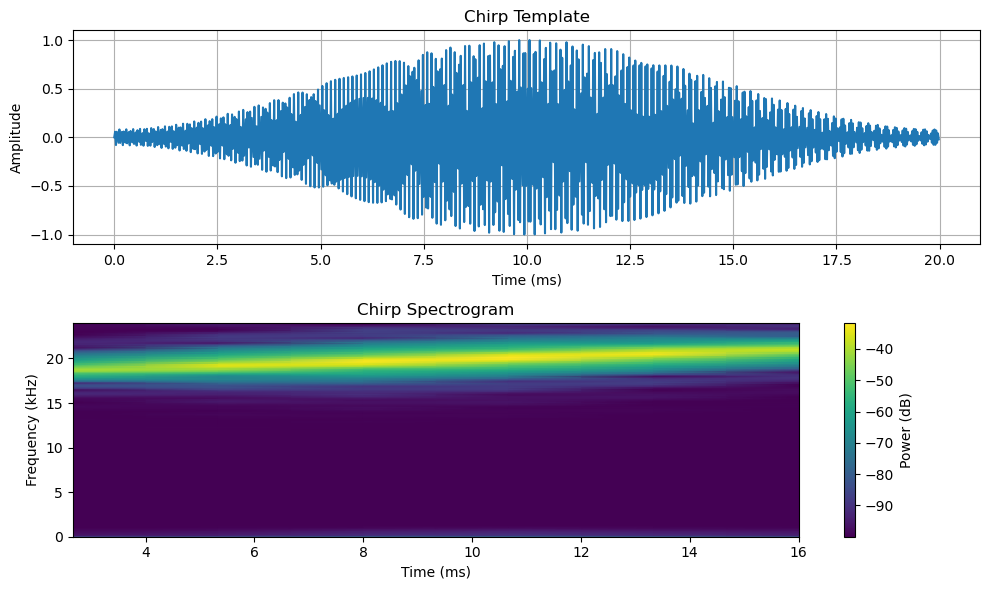

Applied bandpass filter (18000-22000 Hz)
Detected 19 chirps using threshold 0.4108


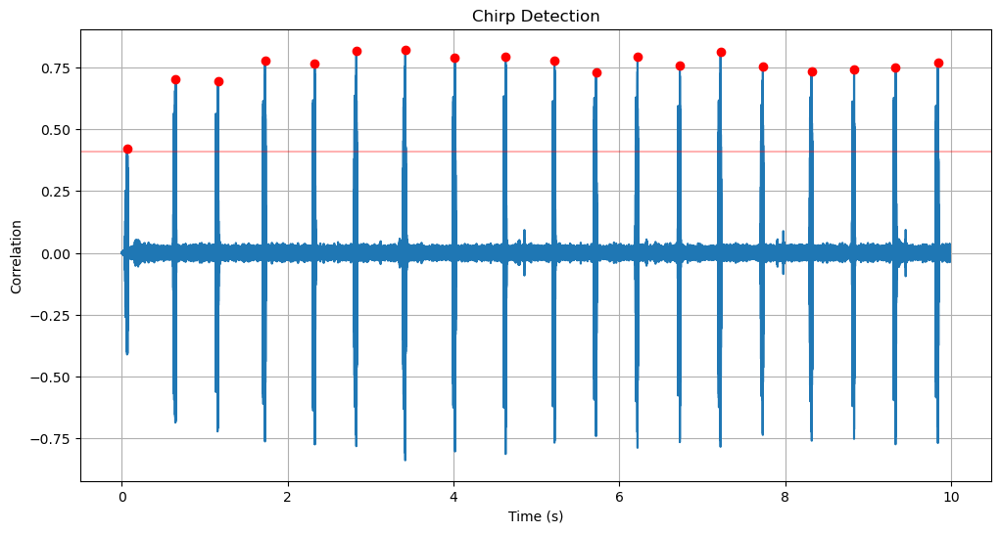

Extracted 19 profiles of 4800 samples each


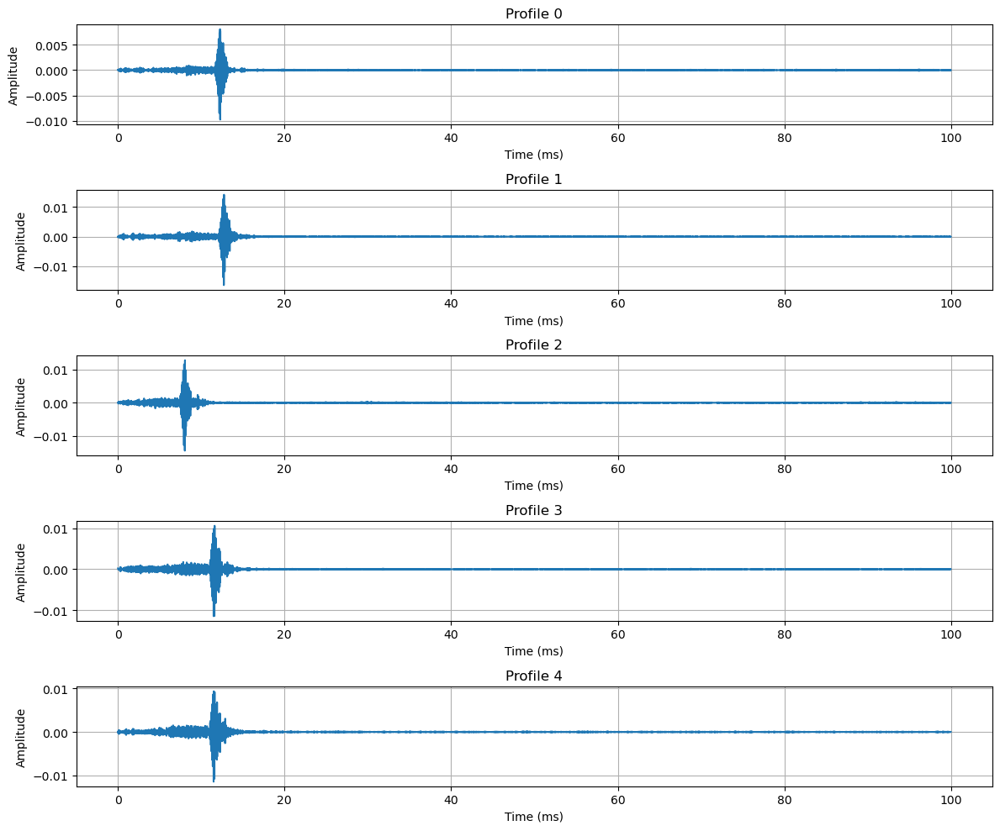


Distance measurement results:
Mean distance: 90.45 cm
Median distance: 77.53 cm
Std deviation: 55.84 cm
Min distance: 18.94 cm
Max distance: 227.24 cm


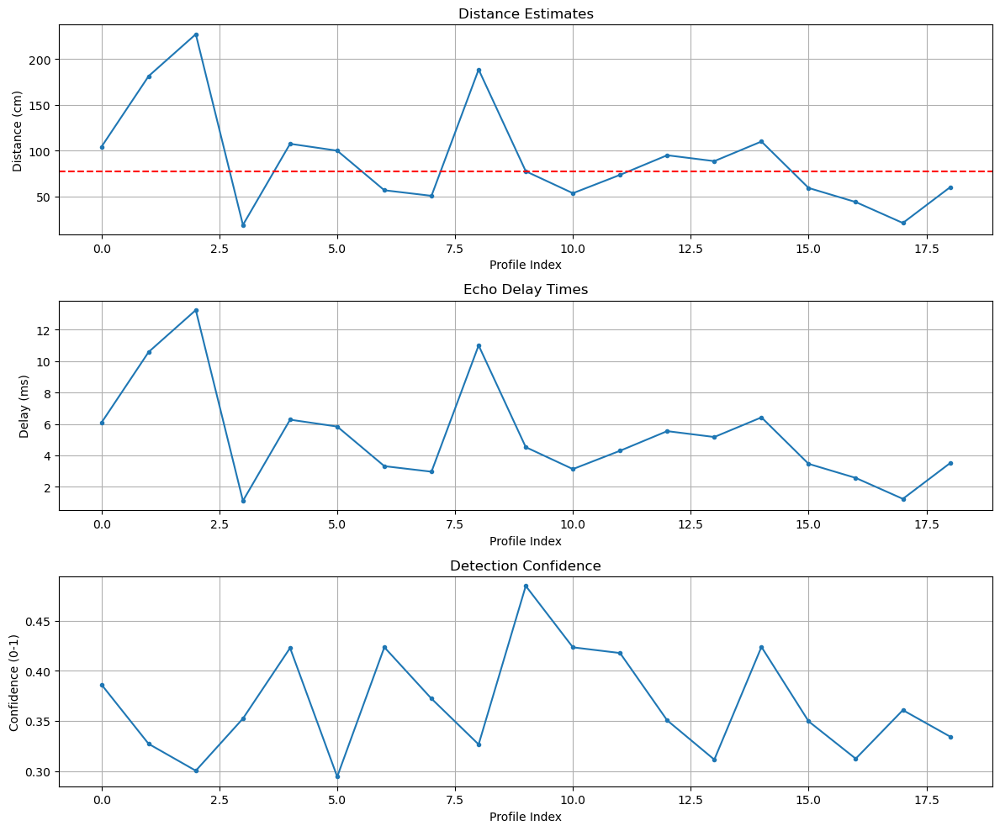

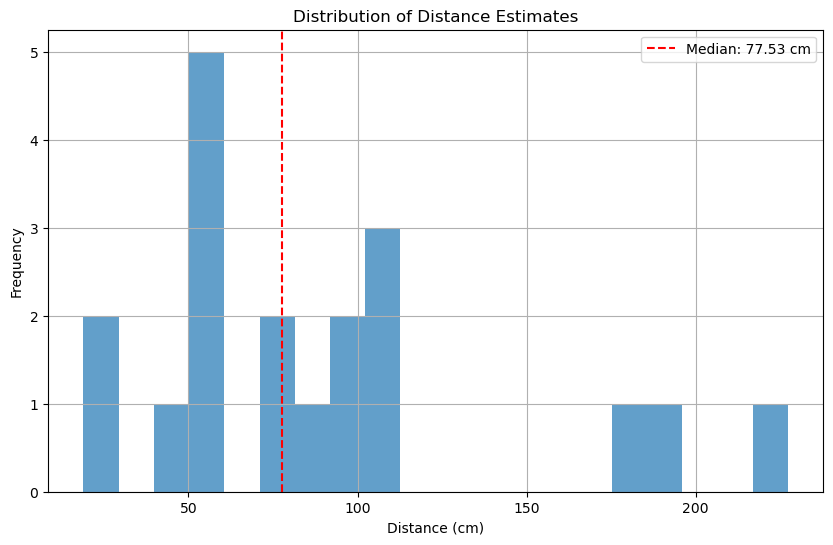

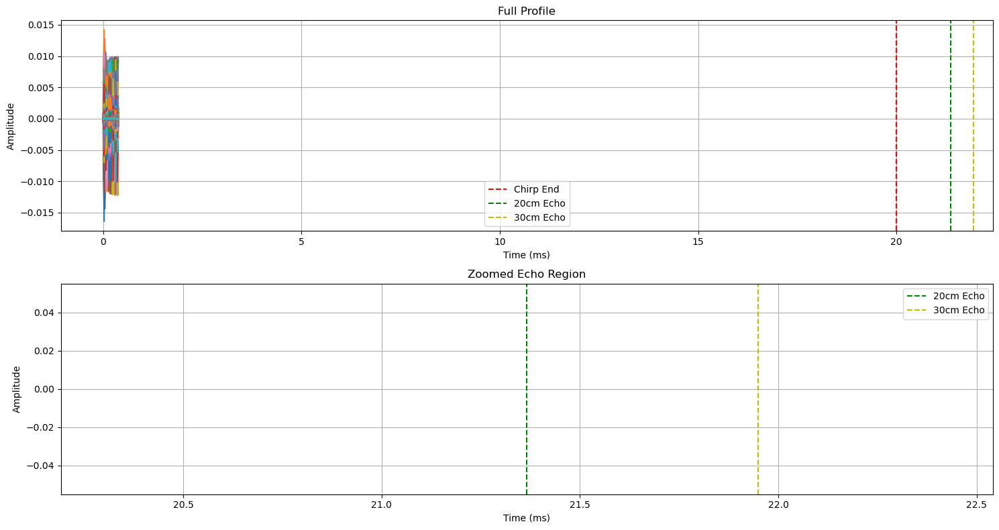


Error metrics:
Mean error: 70.45 cm
Median error: 57.53 cm
Mean absolute error: 70.56 cm
Root mean square error: 88.98 cm


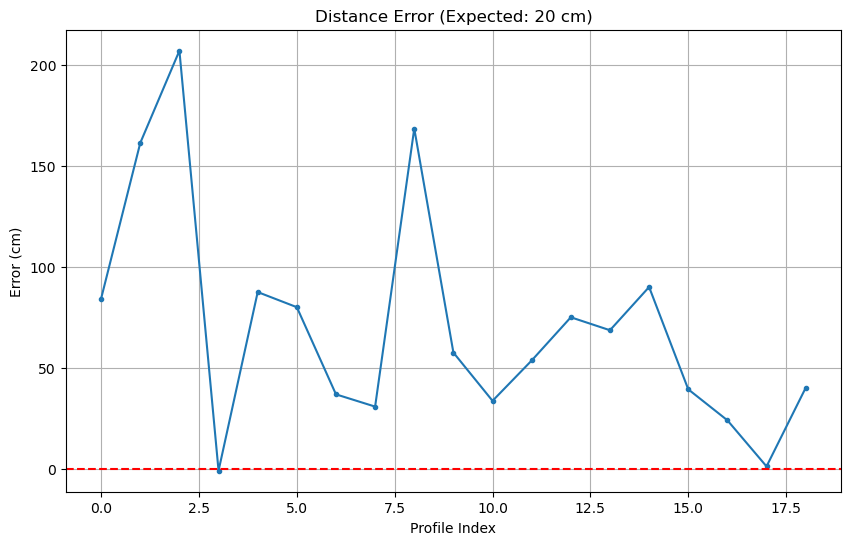


Analyzing file: raw_recording.pcm
Could not load with scipy.io.wavfile: File format b'\x00\x00\x00\x00' not understood. Only 'RIFF' and 'RIFX' supported.
Attempting to read as raw PCM data...
Loaded audio as raw PCM data: 479978 samples at 48000 Hz (assumed)
Loaded audio: 479978 samples at 48000 Hz
Applied bandpass filter (18000-22000 Hz)
Detected 19 chirps using threshold 0.6562


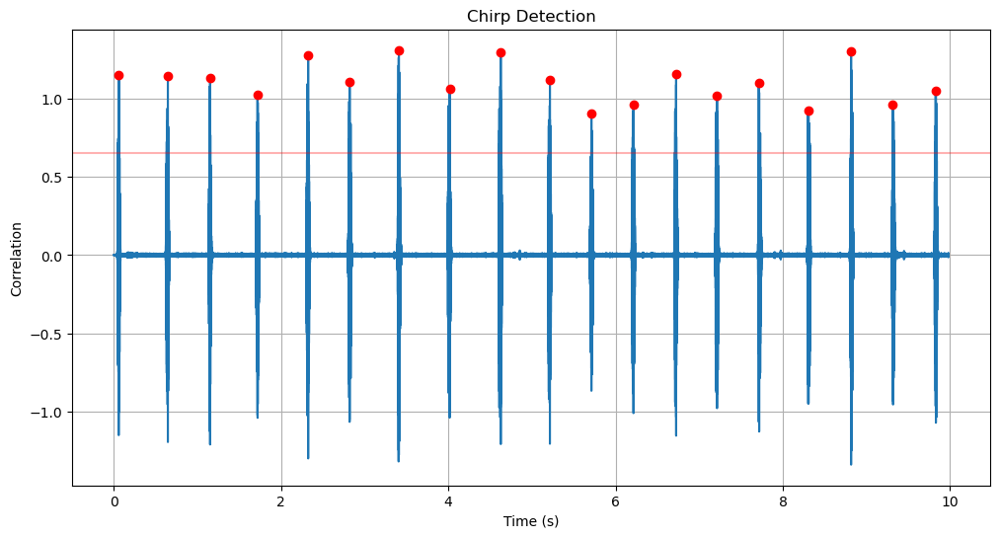

Extracted 19 profiles of 4800 samples each


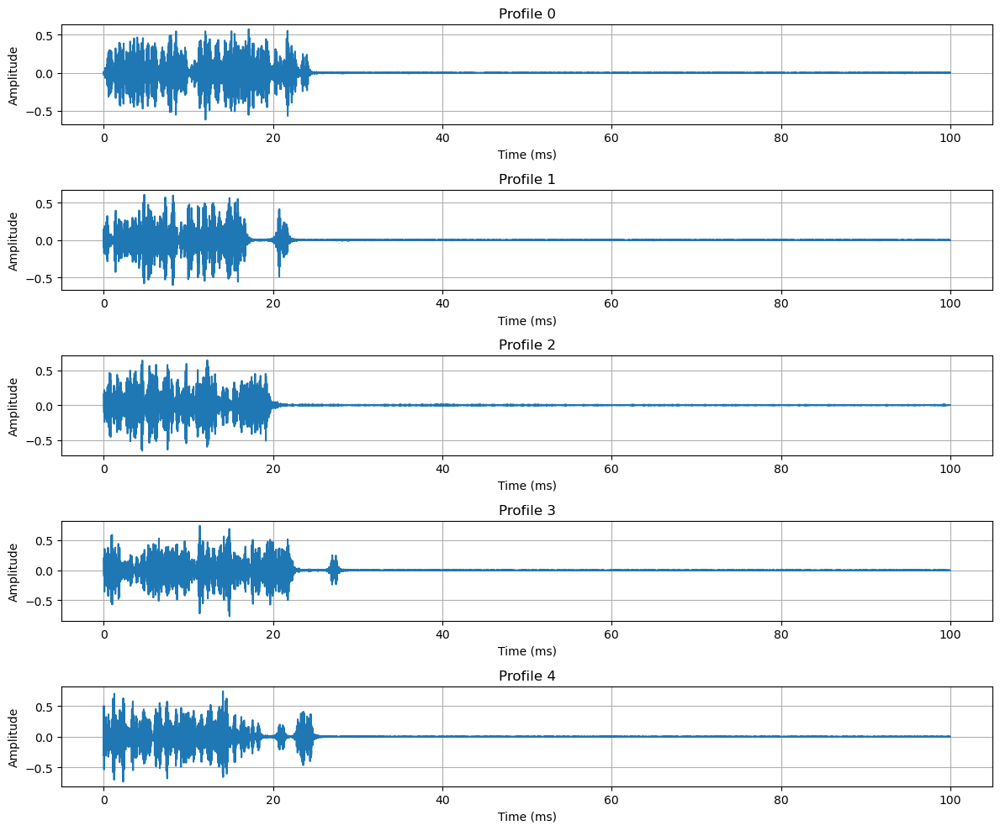


Distance measurement results:
Mean distance: 154.52 cm
Median distance: 152.21 cm
Std deviation: 35.78 cm
Min distance: 89.32 cm
Max distance: 219.38 cm


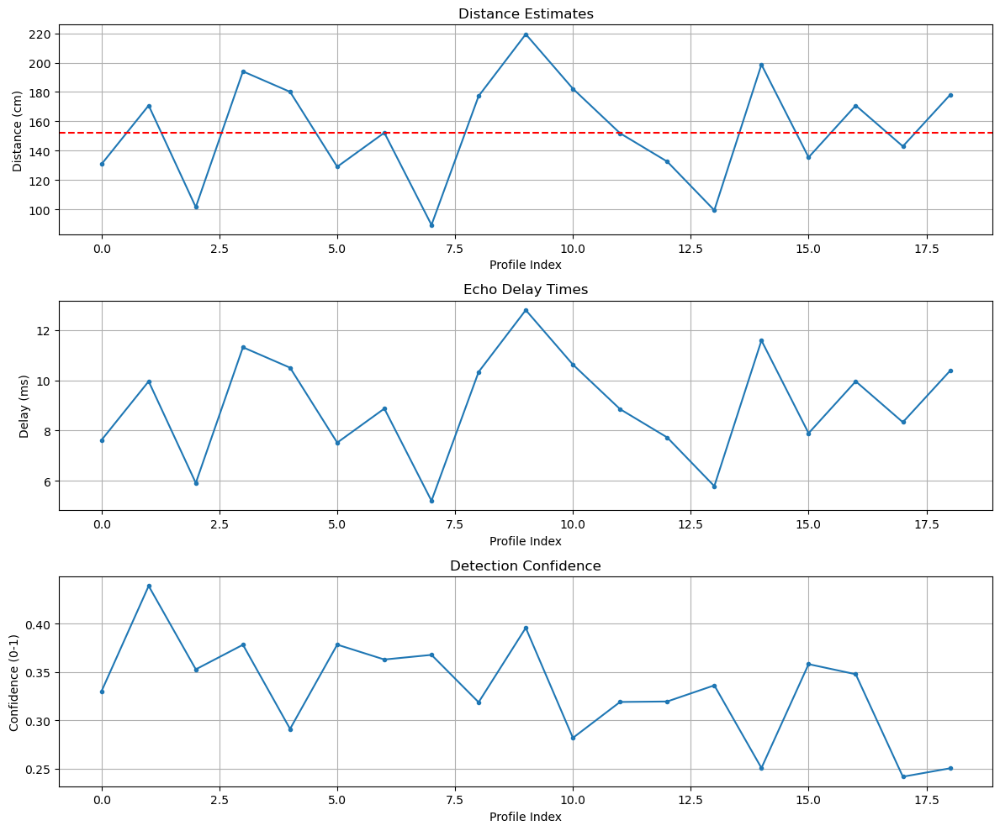

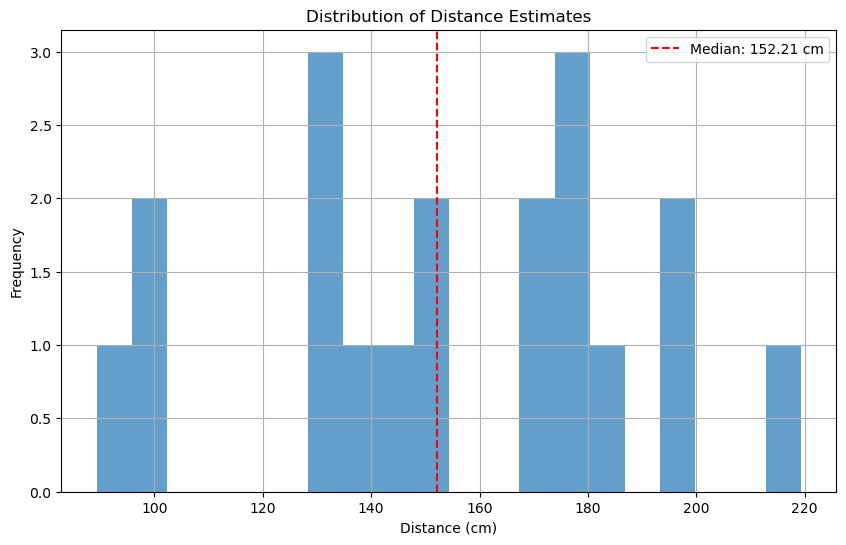

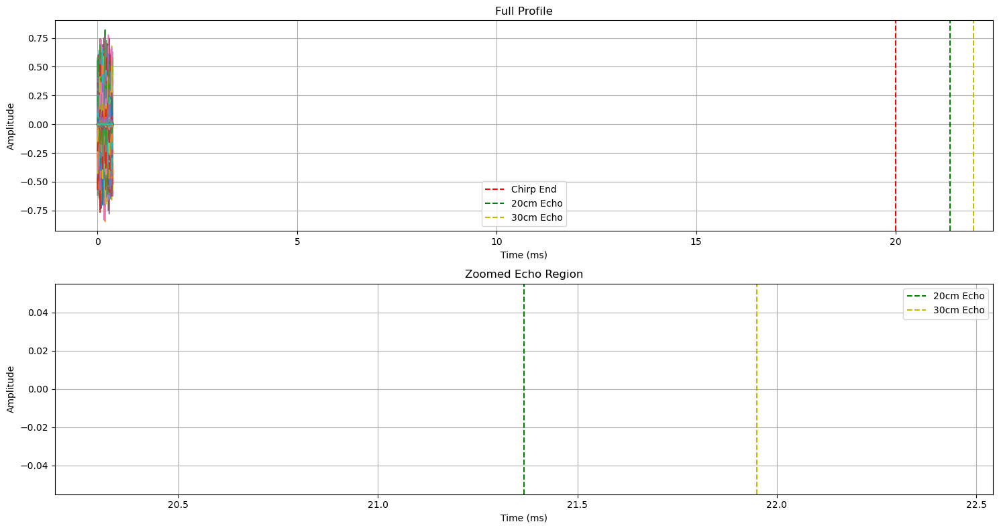


Error metrics:
Mean error: 134.52 cm
Median error: 132.21 cm
Mean absolute error: 134.52 cm
Root mean square error: 138.96 cm


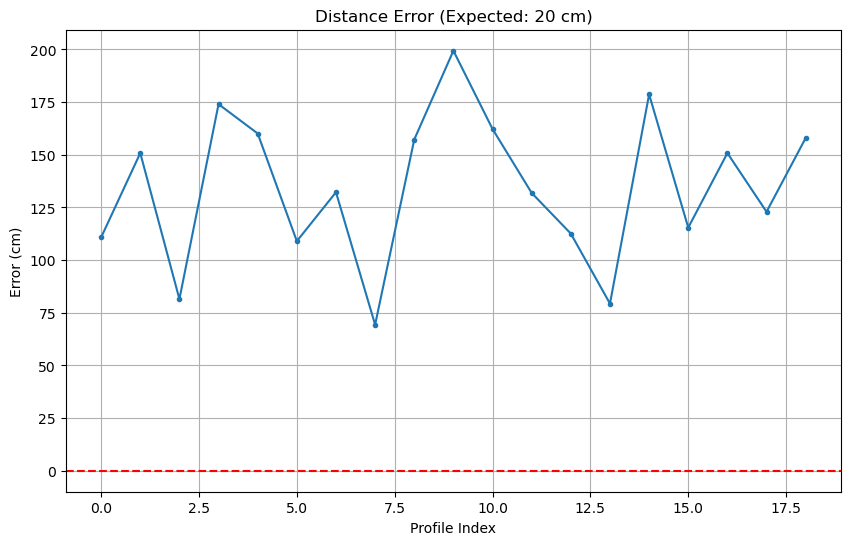


Analyzing file: chirp_template.raw
Could not load with scipy.io.wavfile: File format b'\x00\x00\x08\xfc' not understood. Only 'RIFF' and 'RIFX' supported.
Attempting to read as raw PCM data...
Loaded audio as raw PCM data: 938 samples at 48000 Hz (assumed)
Loaded audio: 938 samples at 48000 Hz
Applied bandpass filter (18000-22000 Hz)
Detected 1 chirps using threshold 0.0907


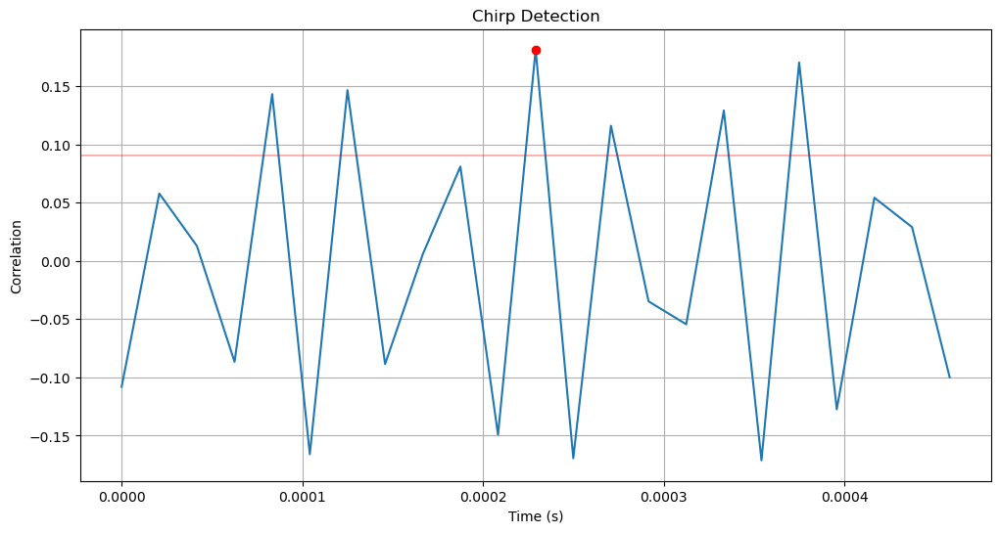

Extracted 0 profiles of 4800 samples each
No valid profiles extracted


In [44]:
# First save the script to a file named echo_validator.py
# Then import it in your notebook
# from echo_validator import EchoValidator, CONFIG, analyze_directory

# Option 1: Analyze a directory of recordings
results = analyze_directory('./D2_IPAD_60', expected_distance=20)

# # Option 2: Analyze a single file
# validator = EchoValidator(CONFIG)
# result = validator.analyze_recording('./d1_stable_mac_20cm/recording.wav', expected_distance=20)

librosa not found. Will use scipy.io.wavfile only (limited format support).
Consider installing librosa for broader audio format support: pip install librosa
SONDAR Echo Detection Validation Tool
------------------------------------
Found 3 audio files in D4_IPAD_40

Running analysis...
Found 3 audio files to analyze

Analyzing file: recording.wav
Could not load with scipy.io.wavfile: Unknown wave file format: RHETOREX_ADPCM. Supported formats: PCM, IEEE_FLOAT
Attempting to read as raw PCM data...
Loaded audio as raw PCM data: 484800 samples at 48000 Hz (assumed)
Loaded audio: 484800 samples at 48000 Hz
Generated chirp template: 960 samples


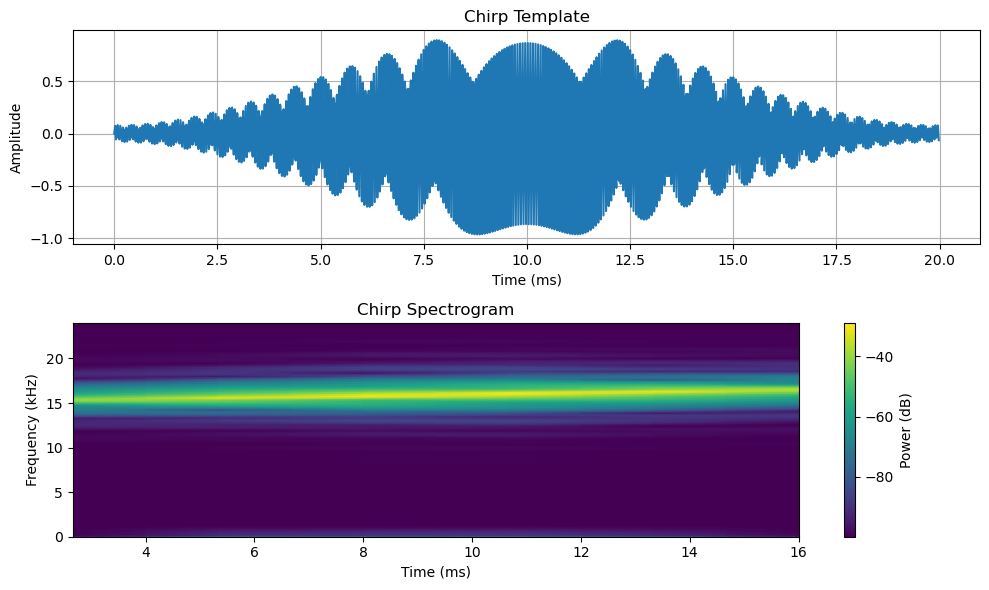

Applied bandpass filter (15000-17000 Hz)
Detected 19 chirps using threshold 1.6332


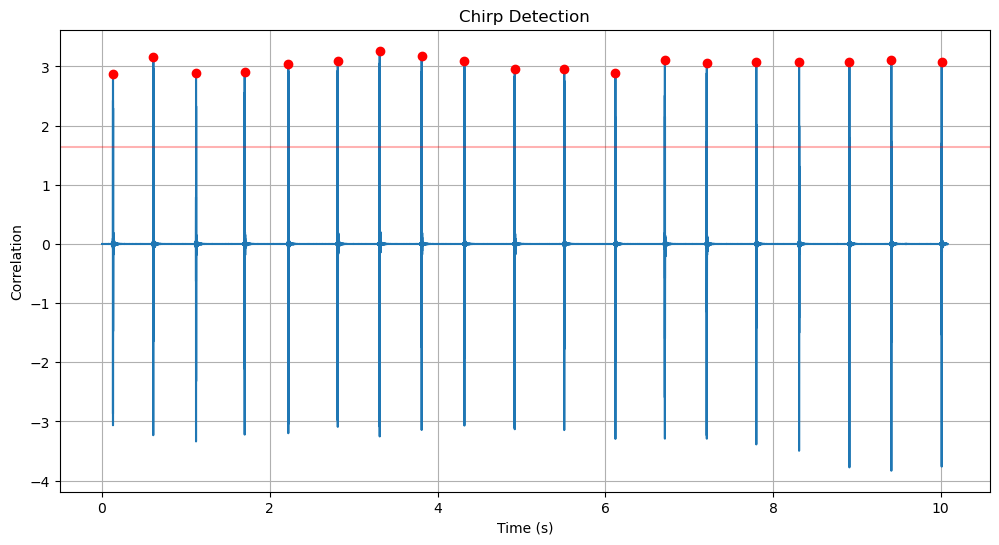

Extracted 18 profiles of 4800 samples each


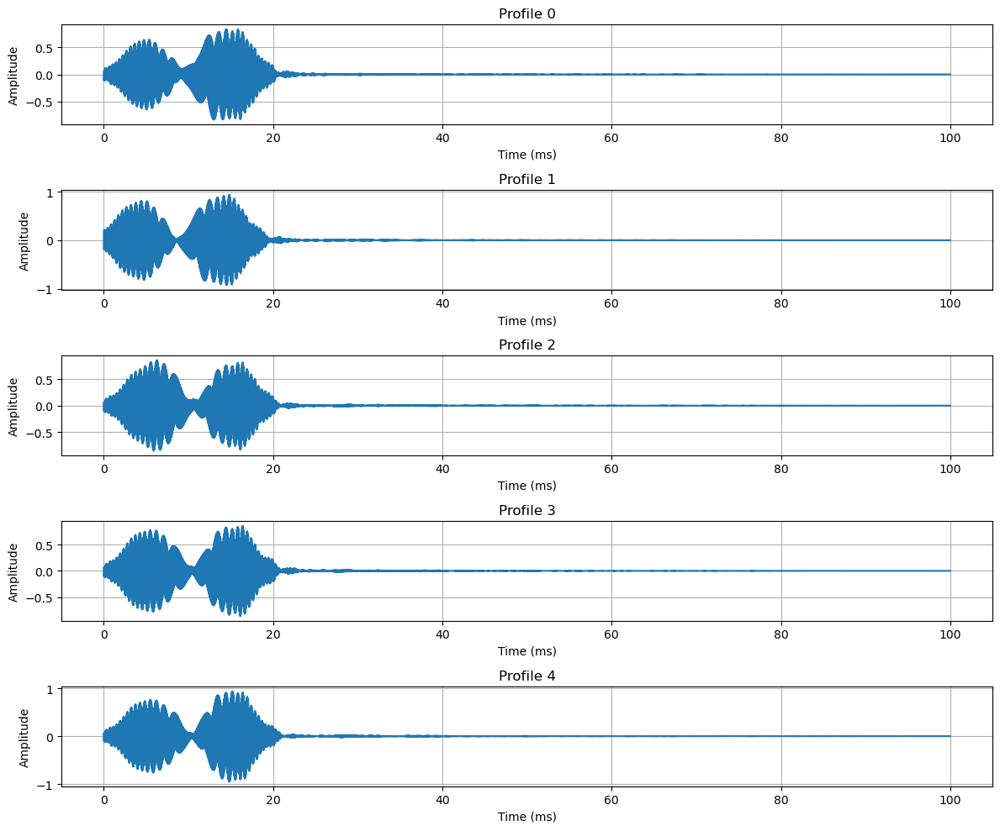

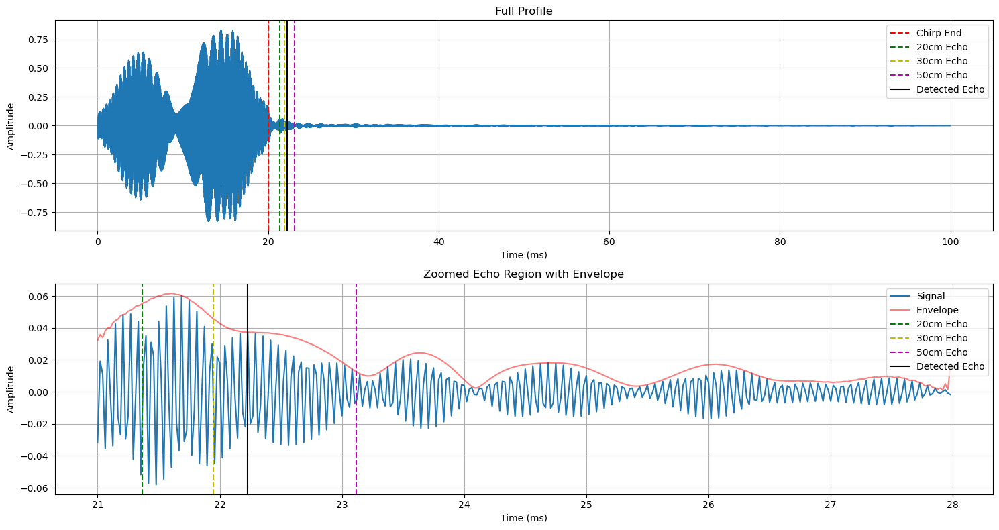

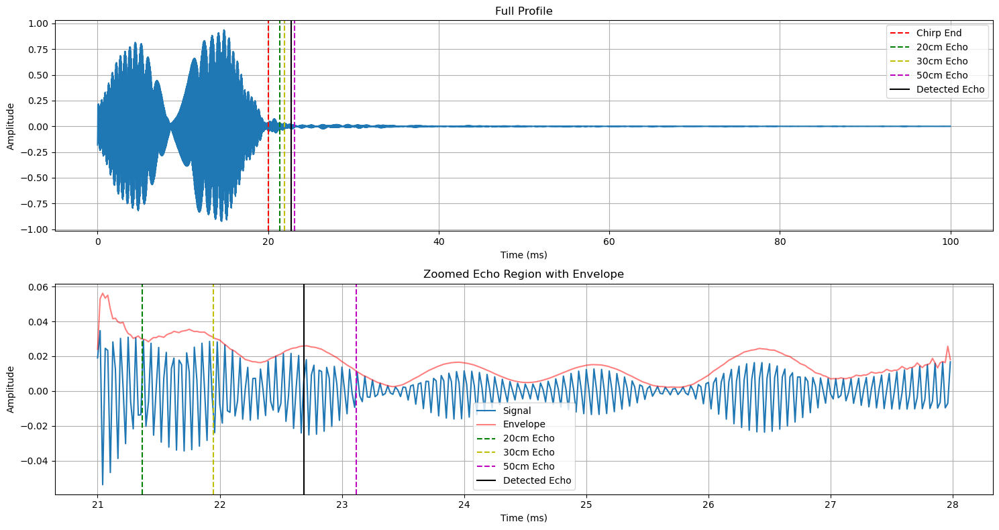

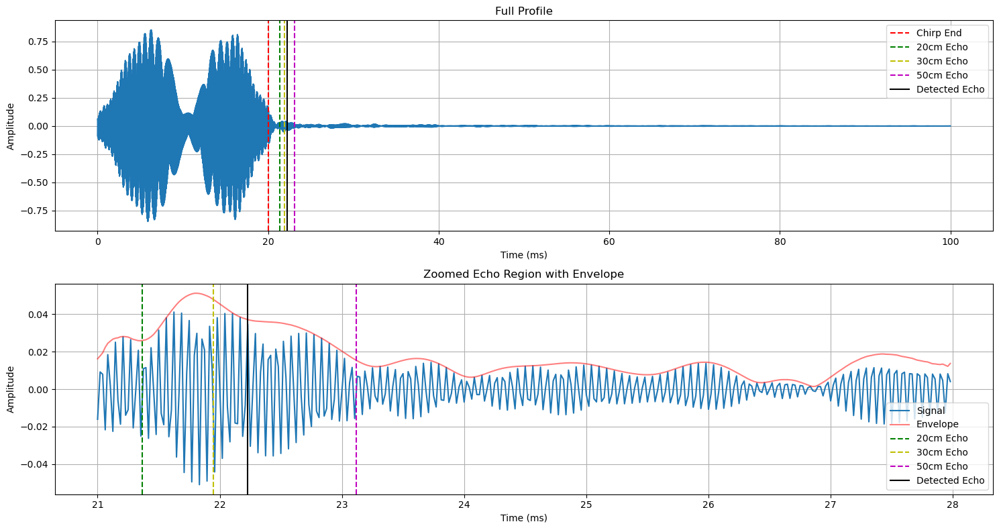

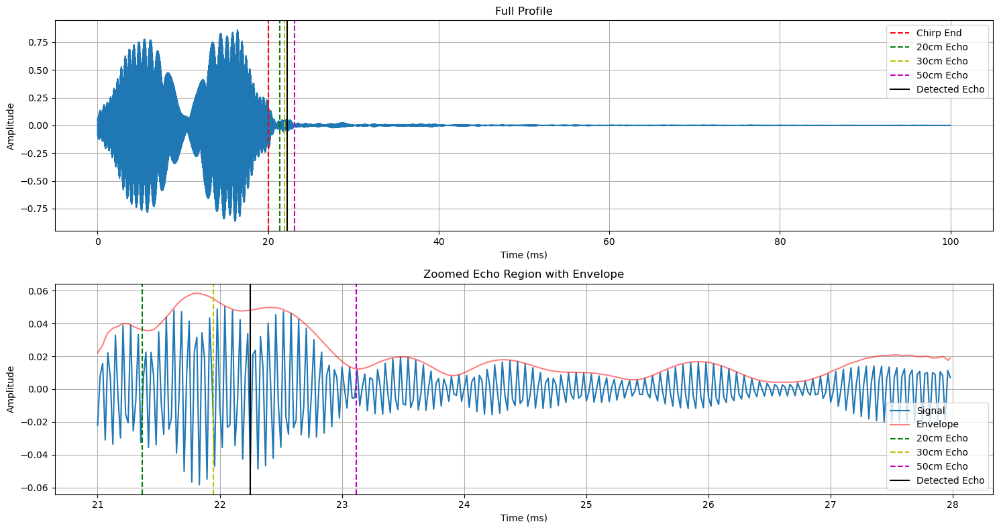

...

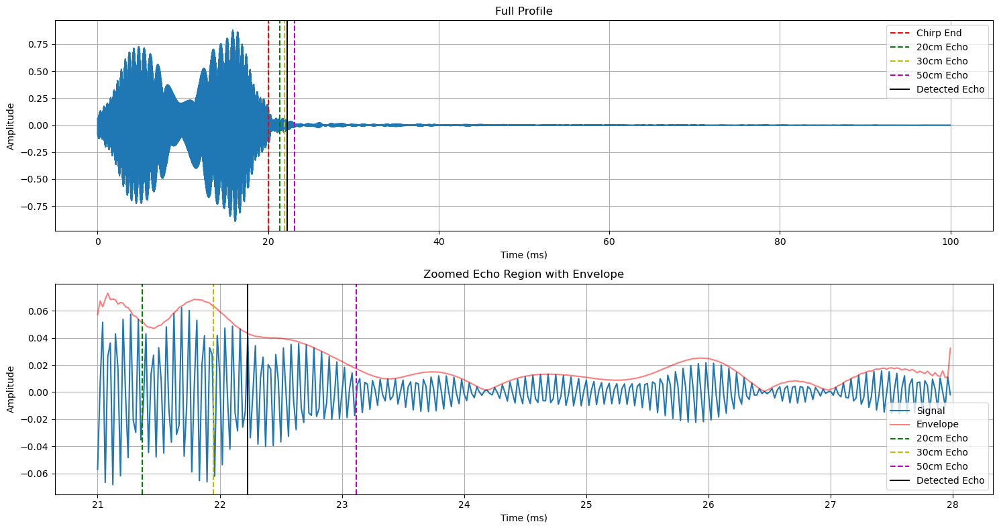

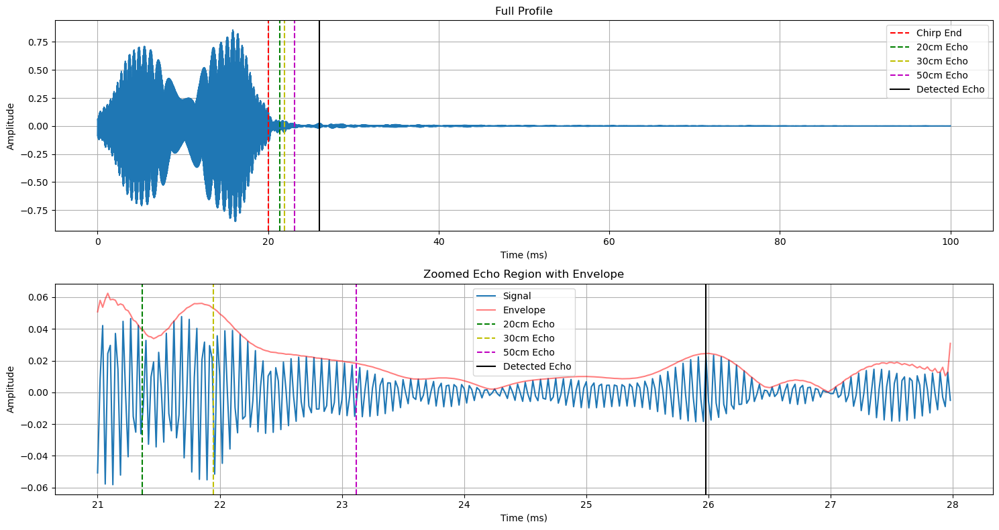

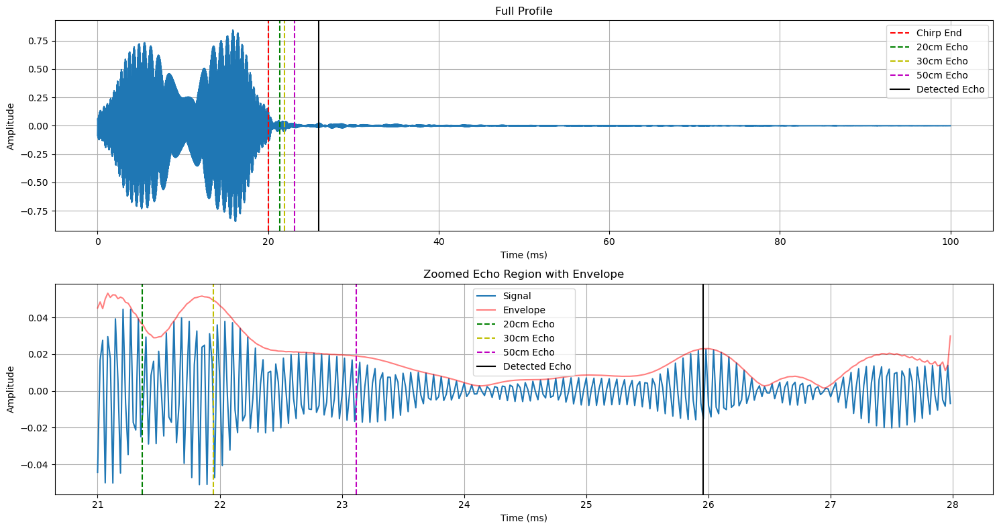

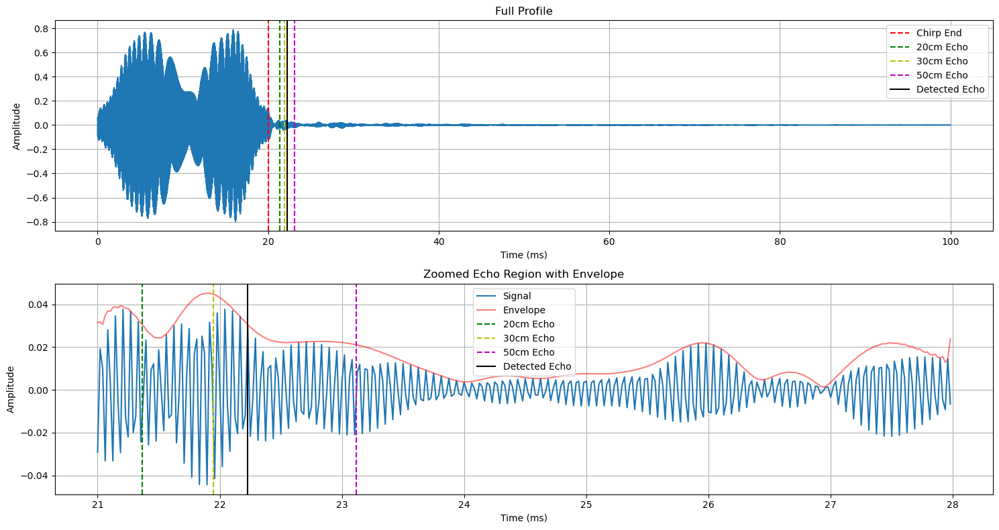

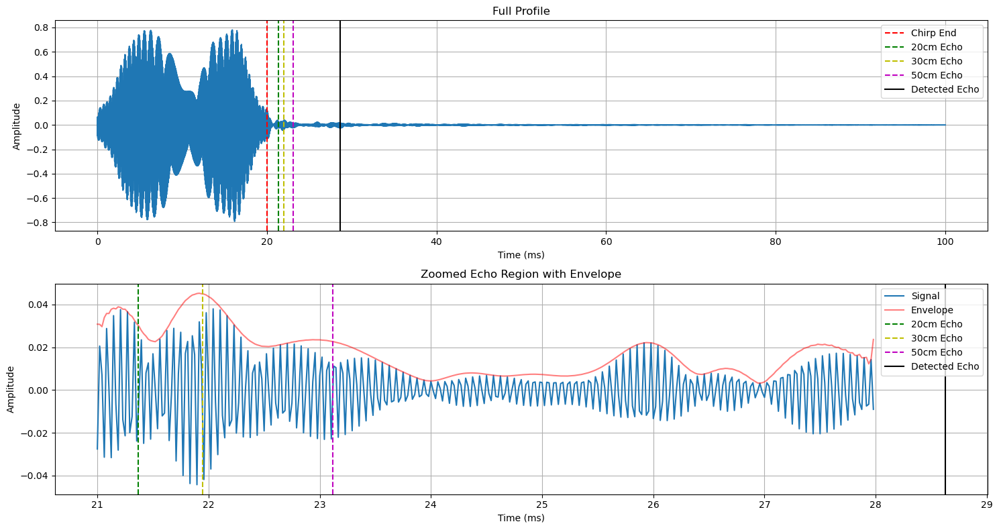


Distance measurement results:
Mean distance: 395.30 cm
Median distance: 382.12 cm
Std deviation: 31.40 cm
Min distance: 381.23 cm
Max distance: 490.92 cm


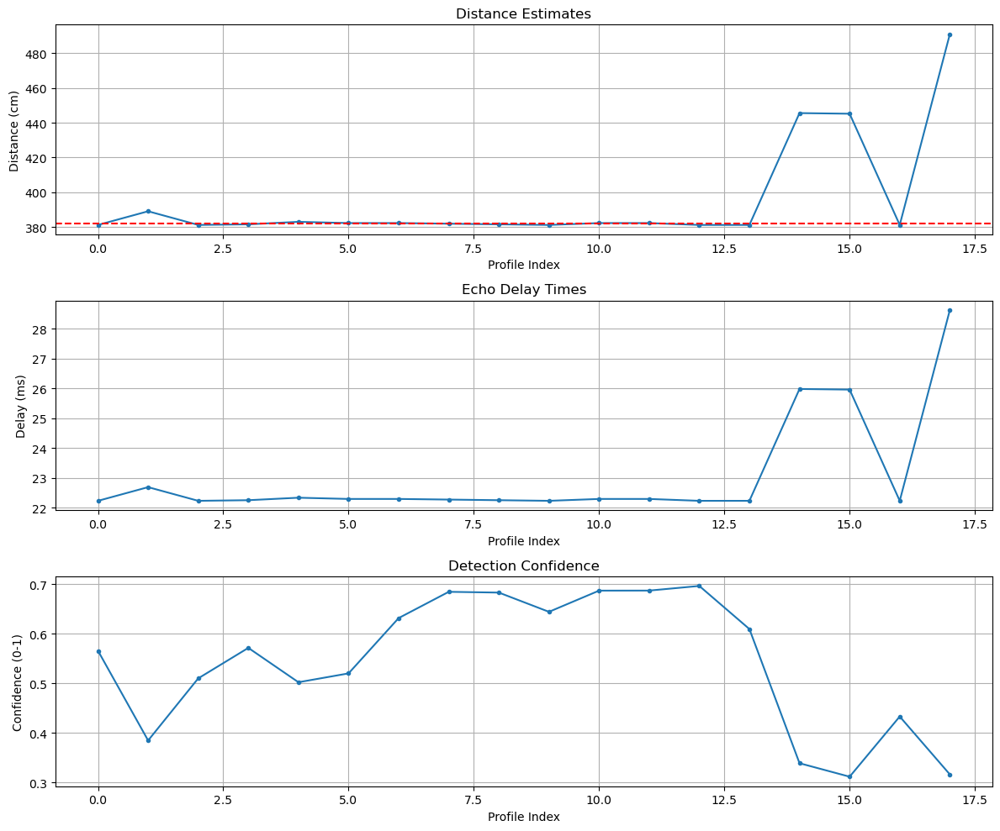

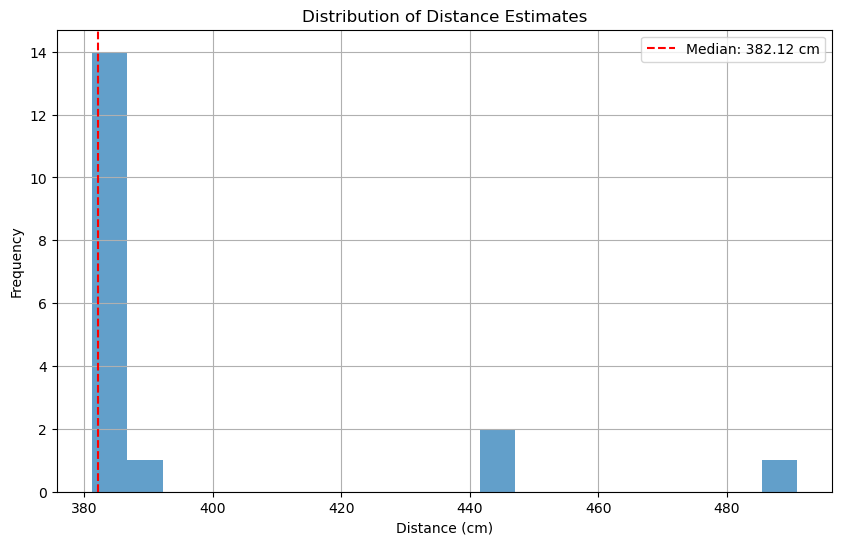


Analyzing file: raw_recording.pcm
Could not load with scipy.io.wavfile: File format b'\x00\x00\x00\x00' not understood. Only 'RIFF' and 'RIFX' supported.
Attempting to read as raw PCM data...
Loaded audio as raw PCM data: 484778 samples at 48000 Hz (assumed)
Loaded audio: 484778 samples at 48000 Hz
Applied bandpass filter (15000-17000 Hz)
Detected 18 chirps using threshold 1.0460


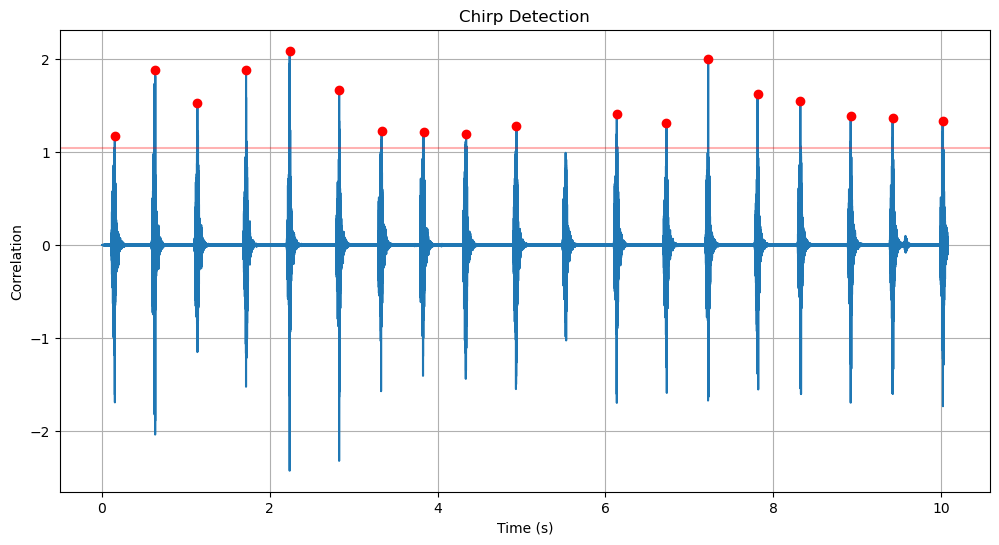

Extracted 17 profiles of 4800 samples each


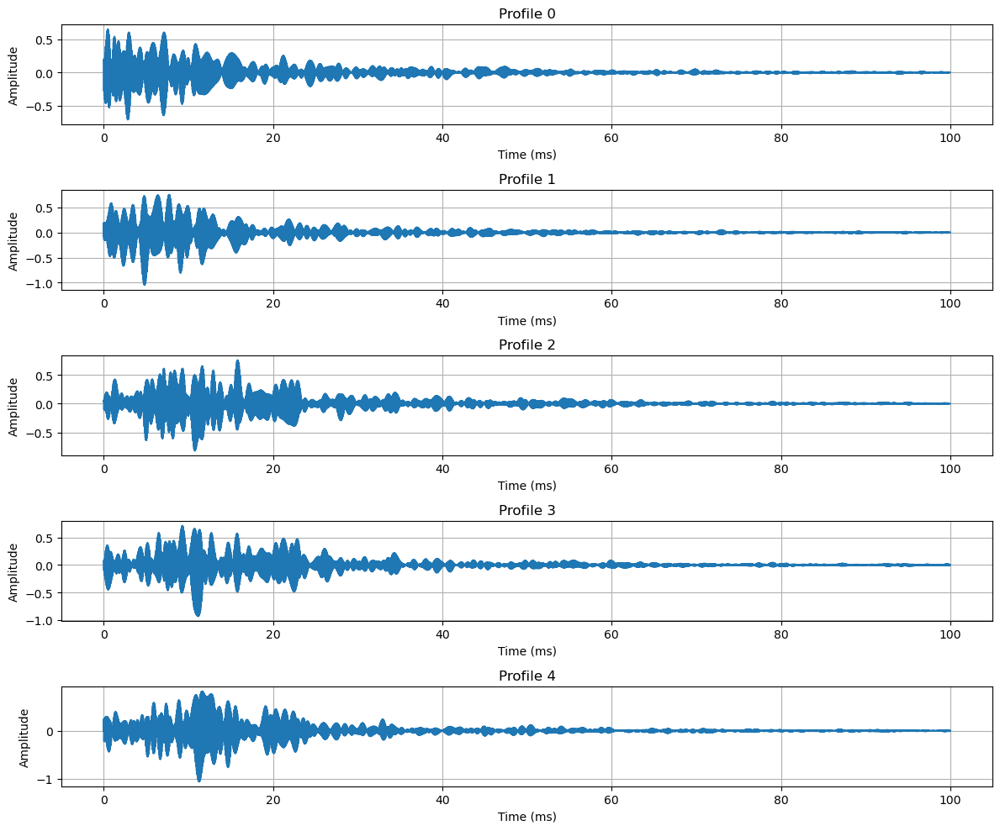

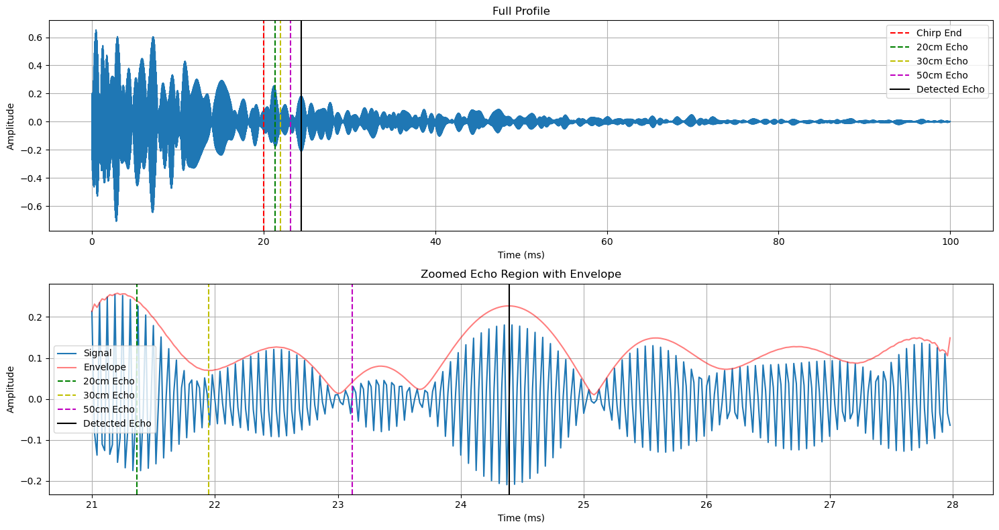

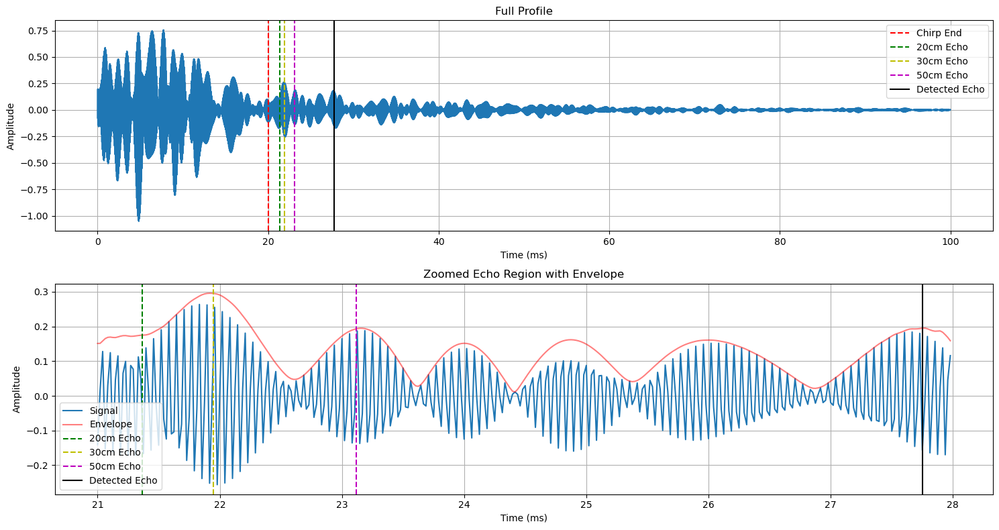

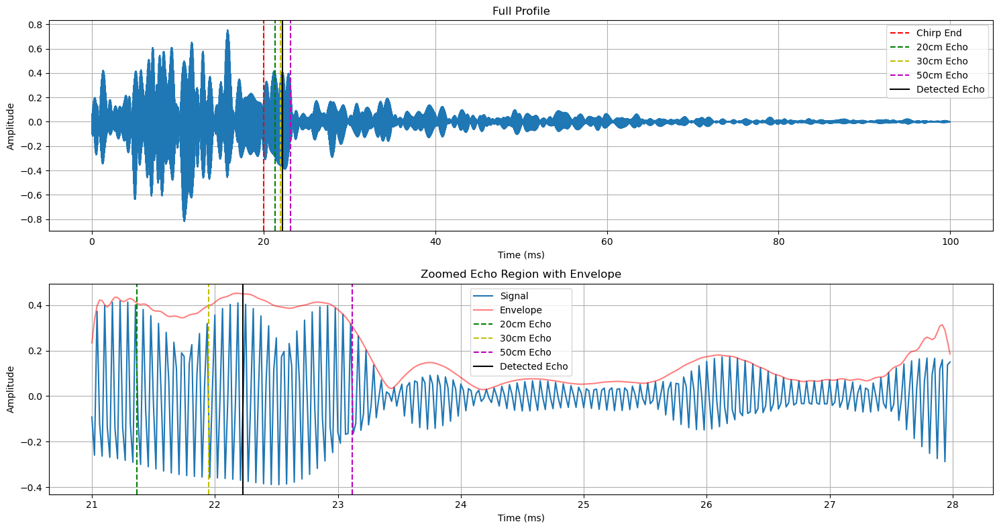

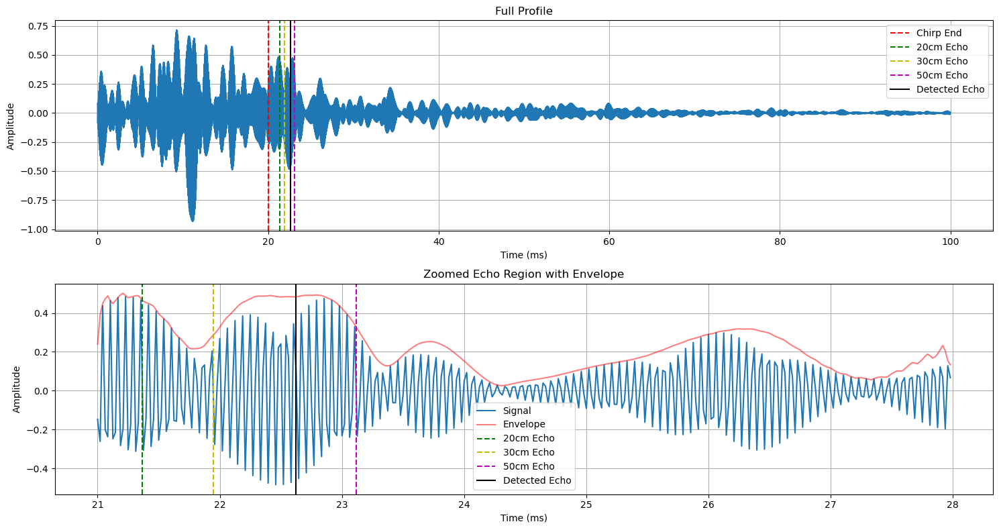

...

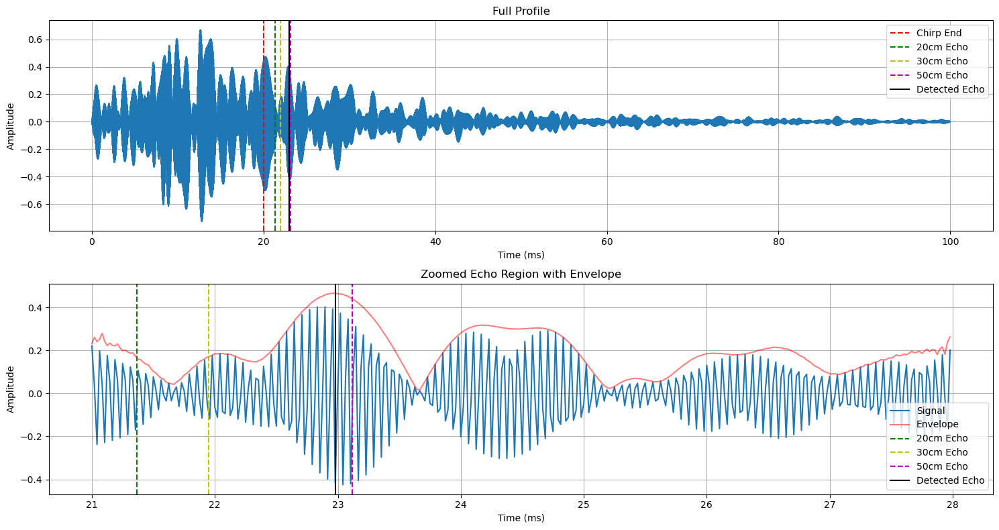

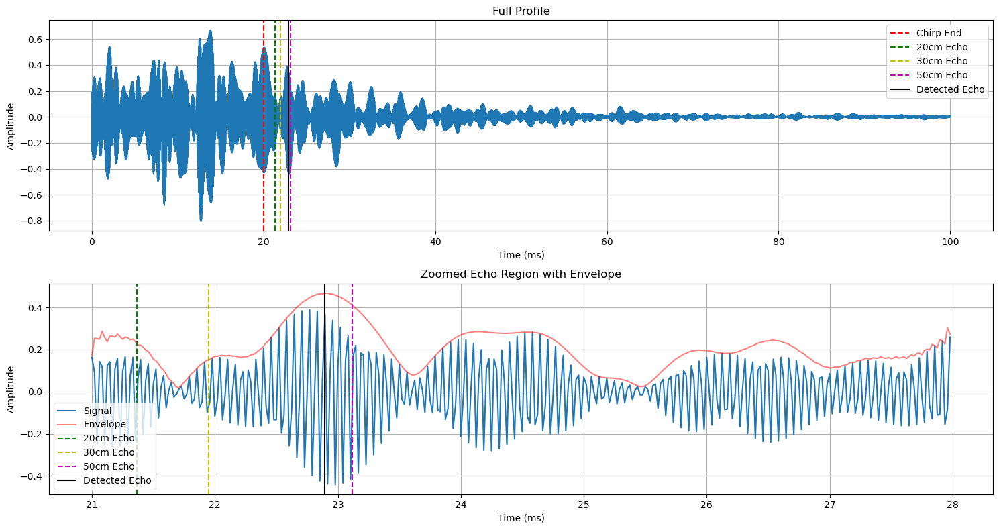

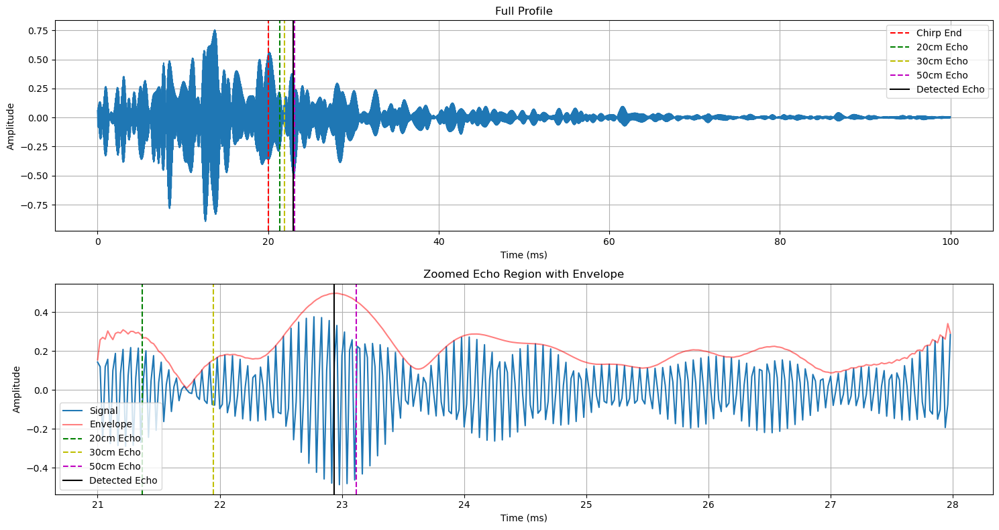

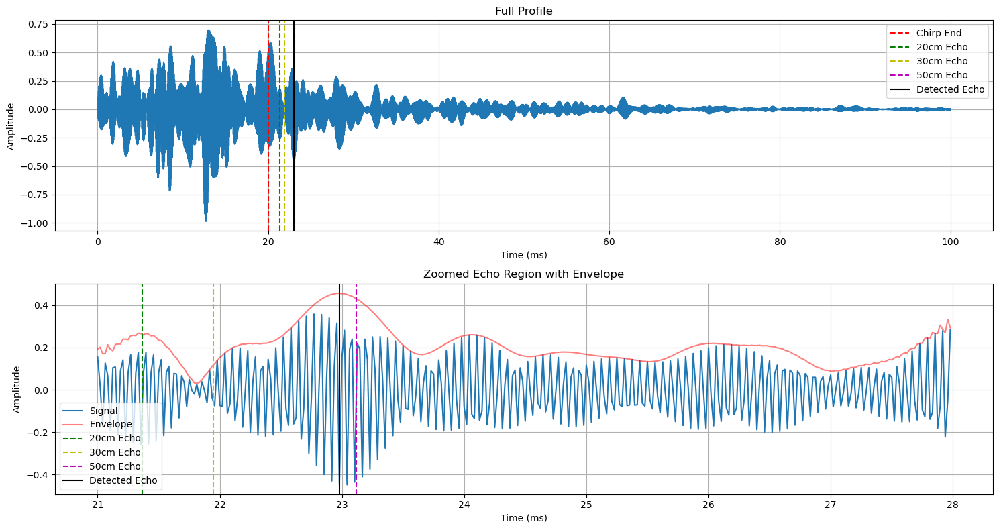

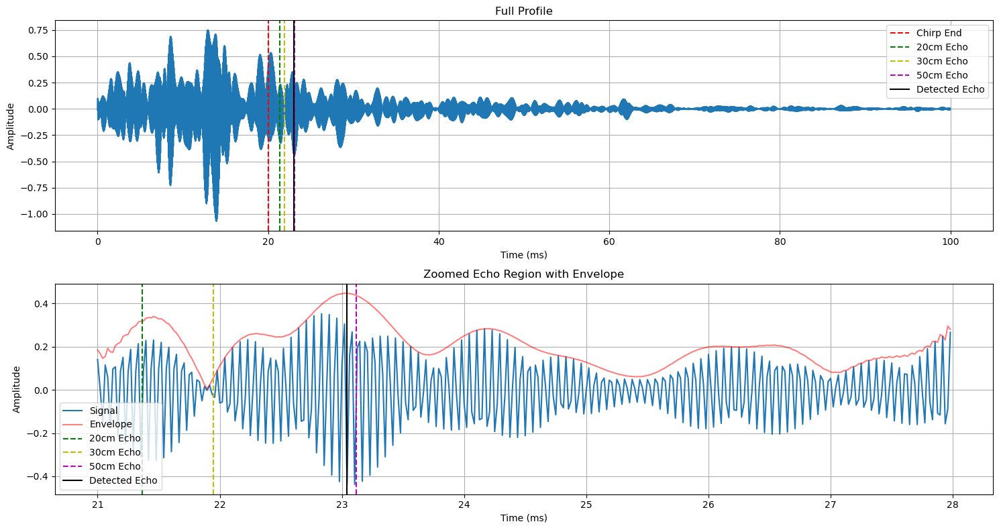


Distance measurement results:
Mean distance: 406.24 cm
Median distance: 394.09 cm
Std deviation: 29.29 cm
Min distance: 381.23 cm
Max distance: 475.91 cm


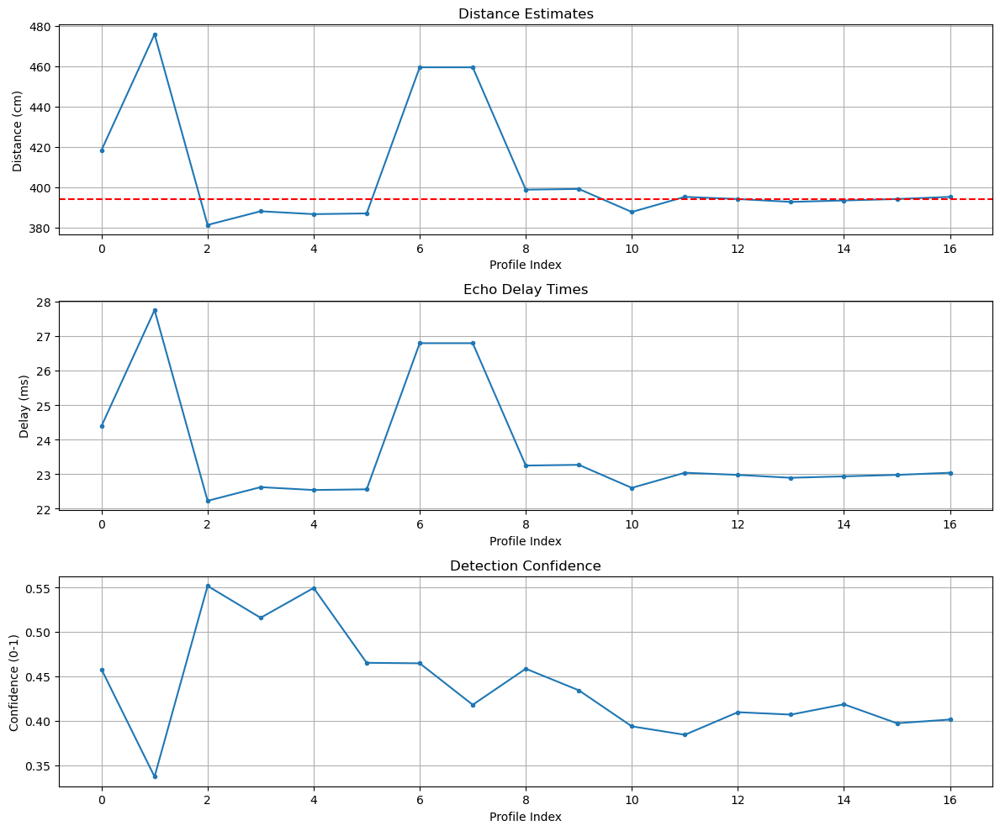

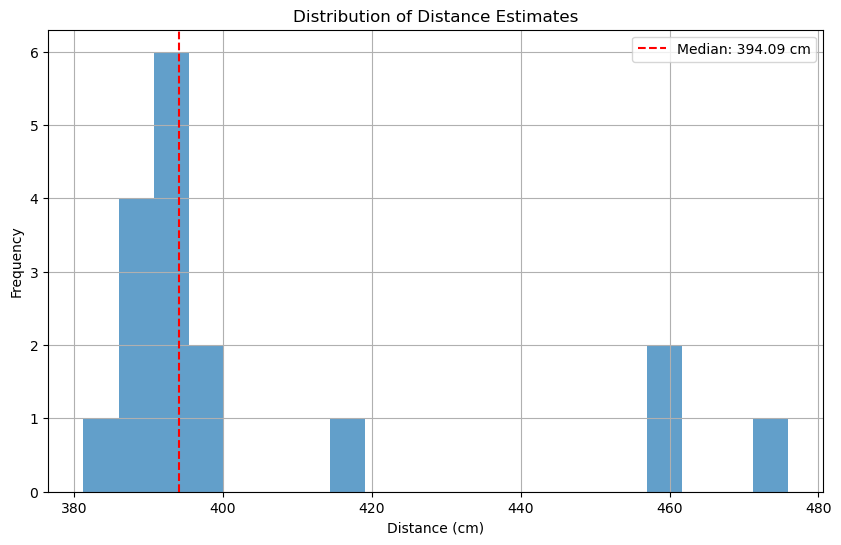


Analyzing file: chirp_template.raw
Could not load with scipy.io.wavfile: File format b'\x00\x00\x08\xfc' not understood. Only 'RIFF' and 'RIFX' supported.
Attempting to read as raw PCM data...
Loaded audio as raw PCM data: 938 samples at 48000 Hz (assumed)
Loaded audio: 938 samples at 48000 Hz
Applied bandpass filter (15000-17000 Hz)
Detected 1 chirps using threshold 0.1035


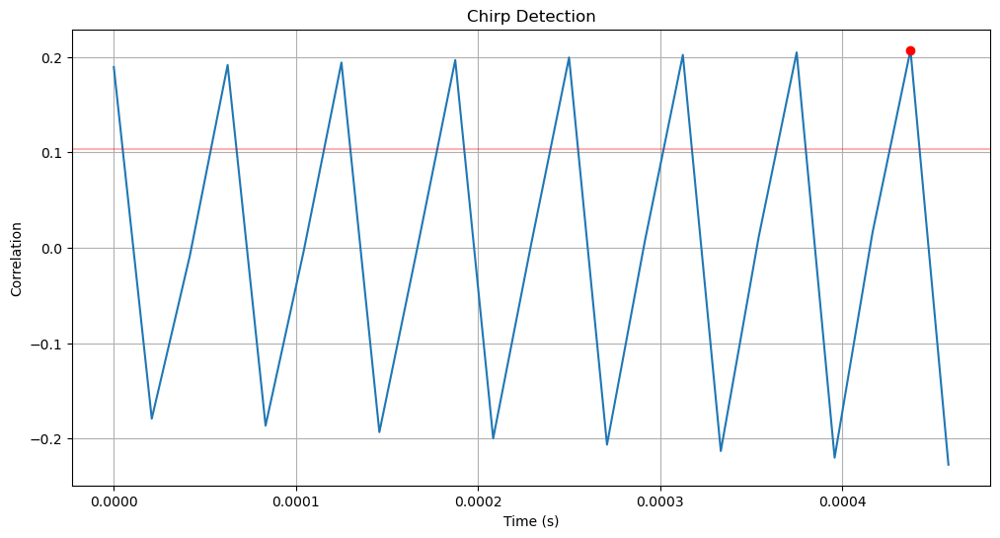

Extracted 0 profiles of 4800 samples each
No valid profiles extracted

Summary Results:
           file_name  num_profiles  mean_distance_cm  median_distance_cm  \
0      recording.wav            18        395.303530          382.123438   
1  raw_recording.pcm            17        406.240625          394.092708   

   std_dev_cm  min_distance_cm  max_distance_cm  
0    31.40179       381.230208        490.91875  
1    29.29247       381.230208        475.91250  

Results saved to D4_IPAD_40/echo_validation_results.csv


In [38]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
import os
import glob
import pandas as pd
from pathlib import Path

# Add alternative audio loading libraries
try:
    import librosa
    HAS_LIBROSA = True
except ImportError:
    HAS_LIBROSA = False
    print("librosa not found. Will use scipy.io.wavfile only (limited format support).")
    print("Consider installing librosa for broader audio format support: pip install librosa")

# Configuration parameters
CONFIG = {
    'chirp_min_freq': 15000,      # Hz
    'chirp_max_freq': 17000,      # Hz
    'chirp_duration_ms': 20,      # ms
    'speed_of_sound': 343,        # m/s
    'search_window_start': 2.0,   # ms - adjust based on the closest expected distance
    'search_window_end': 10.0,     # ms - adjust for the furthest expected distance
    'plot_results': True,         # Set to True to visualize results
    'debug_mode': True            # Enable detailed debug output
}

class EchoValidator:
    """Class for validating echo detection in acoustic sensing data"""
    
    def __init__(self, config):
        """Initialize with configuration parameters"""
        self.config = config
        self.sample_rate = None
        self.chirp_template = None
    
    def generate_chirp_template(self, sample_rate):
        """Generate chirp template based on configuration"""
        self.sample_rate = sample_rate
        
        # Calculate chirp parameters
        chirp_samples = int(sample_rate * self.config['chirp_duration_ms'] / 1000.0)
        chirp_rate = (self.config['chirp_max_freq'] - self.config['chirp_min_freq']) / (self.config['chirp_duration_ms'] / 1000.0)
        
        # Generate time vector
        t = np.arange(chirp_samples) / sample_rate
        
        # Apply Hamming window
        window = np.hamming(chirp_samples)
        
        # Generate linear chirp
        phase = 2 * np.pi * (self.config['chirp_min_freq'] * t + 0.5 * chirp_rate * t * t)
        amplitude = window  # Normalized amplitude
        self.chirp_template = amplitude * np.sin(phase)
        
        if self.config['debug_mode']:
            print(f"Generated chirp template: {len(self.chirp_template)} samples")
            if self.config['plot_results']:
                plt.figure(figsize=(10, 6))
                plt.subplot(2, 1, 1)
                plt.plot(t * 1000, self.chirp_template)  # Time in ms
                plt.title("Chirp Template")
                plt.xlabel("Time (ms)")
                plt.ylabel("Amplitude")
                plt.grid(True)
                
                plt.subplot(2, 1, 2)
                f, t, Sxx = signal.spectrogram(self.chirp_template, sample_rate, nperseg=256, noverlap=128)
                plt.pcolormesh(t * 1000, f / 1000, 10 * np.log10(Sxx + 1e-10), shading='gouraud')
                plt.title("Chirp Spectrogram")
                plt.ylabel('Frequency (kHz)')
                plt.xlabel('Time (ms)')
                plt.colorbar(label='Power (dB)')
                plt.tight_layout()
                plt.show()
        
        return self.chirp_template
    
    def apply_bandpass_filter(self, audio_data):
        """Apply bandpass filter to isolate the chirp frequency range"""
        nyquist = self.sample_rate / 2
        low = self.config['chirp_min_freq'] / nyquist
        high = self.config['chirp_max_freq'] / nyquist
        
        # Use an 8th order Butterworth filter
        b, a = signal.butter(8, [low, high], btype='band')
        filtered_data = signal.filtfilt(b, a, audio_data)
        
        if self.config['debug_mode']:
            print(f"Applied bandpass filter ({self.config['chirp_min_freq']}-{self.config['chirp_max_freq']} Hz)")
        
        return filtered_data
    
    def detect_chirps(self, audio_data, threshold=0.5):
        """
        Detect chirps in the audio data
        
        Args:
            audio_data: Audio signal
            threshold: Detection threshold (0-1)
            
        Returns:
            List of detected chirp start positions (in samples)
        """
        # Use cross-correlation with the chirp template
        correlation = signal.correlate(audio_data, self.chirp_template, mode='valid')
        correlation = correlation / (np.std(audio_data) * np.std(self.chirp_template) * len(self.chirp_template))
        
        # Find peaks in correlation
        # Determine threshold based on correlation statistics
        if threshold < 0:
            # Automatic threshold based on statistics
            threshold = np.mean(correlation) + 3 * np.std(correlation)
        else:
            # Scale threshold based on correlation range
            threshold = threshold * np.max(correlation)
        
        # Fix: Define peaks properly
        peaks, _ = signal.find_peaks(correlation, height=threshold, distance=int(self.sample_rate * 0.1))
        
        if self.config['debug_mode']:
            print(f"Detected {len(peaks)} chirps using threshold {threshold:.4f}")
            
            if self.config['plot_results']:
                plt.figure(figsize=(12, 6))
                t = np.arange(len(correlation)) / self.sample_rate
                plt.plot(t, correlation)
                plt.plot(t[peaks], correlation[peaks], 'ro')
                plt.axhline(y=threshold, color='r', linestyle='-', alpha=0.3)
                plt.title("Chirp Detection")
                plt.xlabel("Time (s)")
                plt.ylabel("Correlation")
                plt.grid(True)
                plt.show()
        
        return peaks
    
    def extract_profiles(self, audio_data, chirp_positions, profile_duration_ms=100):
        """
        Extract profiles around each chirp
        
        Args:
            audio_data: Audio signal
            chirp_positions: List of chirp positions in samples
            profile_duration_ms: Duration of each profile in ms
            
        Returns:
            List of profiles (numpy arrays)
        """
        profiles = []
        samples_per_profile = int(self.sample_rate * profile_duration_ms / 1000)
        
        for pos in chirp_positions:
            # Extract profile ensuring we don't go out of bounds
            if pos + samples_per_profile <= len(audio_data):
                profile = audio_data[pos:pos + samples_per_profile]
                profiles.append(profile)
        
        if self.config['debug_mode']:
            print(f"Extracted {len(profiles)} profiles of {samples_per_profile} samples each")
            
            if self.config['plot_results'] and profiles:
                # Plot a few example profiles
                num_to_plot = min(5, len(profiles))
                plt.figure(figsize=(12, 10))
                
                for i in range(num_to_plot):
                    plt.subplot(num_to_plot, 1, i+1)
                    t = np.arange(len(profiles[i])) / self.sample_rate * 1000  # Time in ms
                    plt.plot(t, profiles[i])
                    plt.title(f"Profile {i}")
                    plt.xlabel("Time (ms)")
                    plt.ylabel("Amplitude")
                    plt.grid(True)
                plt.tight_layout()
                plt.show()
        
        return profiles
    
    def detect_echo(self, profile):
        """
        Detect echo in a single profile with improved sensitivity
        
        Args:
            profile: Single profile array
            
        Returns:
            delay_time: Time delay in seconds
            distance: Estimated distance in cm
            confidence: Detection confidence (0-1)
        """
        # Define search window in samples
        search_start = int(self.config['search_window_start'] * self.sample_rate / 1000)
        search_end = int(self.config['search_window_end'] * self.sample_rate / 1000)
        search_end = min(search_end, len(profile))
        
        # Chirp end (where direct path ends)
        chirp_end = int(self.config['chirp_duration_ms'] * self.sample_rate / 1000)
        
        # Adjust search start to be after chirp end
        search_start = max(search_start + chirp_end, 0)
        search_end = max(search_end + chirp_end, search_start + 1)
        
        # Focus on the search window
        if search_end <= search_start or search_end > len(profile):
            # Invalid search window
            return 0, 0, 0
            
        search_region = profile[search_start:search_end]
        
        # Apply envelope detection for better sensitivity
        analytic_signal = signal.hilbert(search_region)
        amplitude_envelope = np.abs(analytic_signal)
        
        # Smooth the envelope
        window_size = min(21, len(amplitude_envelope) - 1)
        if window_size > 2:  # Need at least 3 points for smoothing
            amplitude_envelope = signal.savgol_filter(amplitude_envelope, window_size, 1)
        
        # Find peaks in the envelope
        peak_indices, _ = signal.find_peaks(amplitude_envelope, height=np.mean(amplitude_envelope)*1.5)
        
        if len(peak_indices) == 0:
            # If no clear peaks, use the maximum value point
            peak_idx = np.argmax(amplitude_envelope)
        else:
            # Use the strongest peak
            peak_values = amplitude_envelope[peak_indices]
            strongest_peak_idx = np.argmax(peak_values)
            peak_idx = peak_indices[strongest_peak_idx]
        
        # Calculate time delay (adjust for search window offset)
        delay_samples = search_start + peak_idx
        delay_time = delay_samples / self.sample_rate
        
        # Calculate distance (divide by 2 for round trip)
        distance = self.config['speed_of_sound'] * delay_time / 2 * 100  # cm
        
        # Calculate confidence based on peak strength
        if len(amplitude_envelope) > 0:
            peak_value = amplitude_envelope[peak_idx]
            mean_value = np.mean(amplitude_envelope)
            if mean_value > 0:
                snr = peak_value / mean_value
                confidence = min(1.0, snr / 5)  # Scale to 0-1, cap at 1.0
            else:
                confidence = 0.5
        else:
            confidence = 0
        
        # Visualize the echo detection (optional)
        if self.config['debug_mode'] and self.config['plot_results']:
            self.debug_echo_detection(profile, delay_samples)
        
        return delay_time, distance, confidence
    
    def debug_echo_detection(self, profile, detected_echo_sample):
        """Visualize the echo detection process with enhanced detail"""
        # Time in milliseconds
        t = np.arange(len(profile)) / self.sample_rate * 1000
        
        # Chirp end point (in samples)
        chirp_end = int(self.config['chirp_duration_ms'] * self.sample_rate / 1000)
        
        # Expected time regions for different distances
        echo_20cm_time = self.config['chirp_duration_ms'] + (2 * 20 / 34300 * 1000) + 0.2  # 2*distance/speed of sound (in ms)
        echo_30cm_time = self.config['chirp_duration_ms'] + (2 * 30 / 34300 * 1000) + 0.2
        echo_50cm_time = self.config['chirp_duration_ms'] + (2 * 50 / 34300 * 1000) + 0.2
        
        plt.figure(figsize=(15, 8))
        
        # Plot full profile
        plt.subplot(2, 1, 1)
        plt.plot(t, profile)
        plt.axvline(x=self.config['chirp_duration_ms'], color='r', linestyle='--', label='Chirp End')
        plt.axvline(x=echo_20cm_time, color='g', linestyle='--', label='20cm Echo')
        plt.axvline(x=echo_30cm_time, color='y', linestyle='--', label='30cm Echo')
        plt.axvline(x=echo_50cm_time, color='m', linestyle='--', label='50cm Echo')
        if detected_echo_sample > 0:
            detected_time = detected_echo_sample / self.sample_rate * 1000
            plt.axvline(x=detected_time, color='k', linestyle='-', label='Detected Echo')
        plt.title("Full Profile")
        plt.xlabel("Time (ms)")
        plt.ylabel("Amplitude")
        plt.legend()
        plt.grid(True)
        
        # Plot zoomed echo region with amplitude enhancement
        plt.subplot(2, 1, 2)
        search_start = int((self.config['chirp_duration_ms'] + 1) * self.sample_rate / 1000)
        search_end = int((self.config['chirp_duration_ms'] + 8) * self.sample_rate / 1000)
        search_end = min(search_end, len(profile))
        
        if search_end > search_start:
            echo_region = profile[search_start:search_end]
            echo_t = t[search_start:search_end]
            
            # Apply envelope detection
            analytic_signal = signal.hilbert(echo_region)
            amplitude_envelope = np.abs(analytic_signal)
            
            # Plot both the signal and its envelope
            plt.plot(echo_t, echo_region, label='Signal')
            plt.plot(echo_t, amplitude_envelope, 'r-', label='Envelope', alpha=0.5)
            
            plt.axvline(x=echo_20cm_time, color='g', linestyle='--', label='20cm Echo')
            plt.axvline(x=echo_30cm_time, color='y', linestyle='--', label='30cm Echo')
            plt.axvline(x=echo_50cm_time, color='m', linestyle='--', label='50cm Echo')
            
            if detected_echo_sample > 0:
                detected_time = detected_echo_sample / self.sample_rate * 1000
                plt.axvline(x=detected_time, color='k', linestyle='-', label='Detected Echo')
            
            plt.title("Zoomed Echo Region with Envelope")
            plt.xlabel("Time (ms)")
            plt.ylabel("Amplitude")
            plt.legend()
            plt.grid(True)
        
        plt.tight_layout()
        plt.show()
    
    def analyze_profiles(self, profiles):
        """
        Analyze multiple profiles to estimate distance
        
        Args:
            profiles: List of profiles
            
        Returns:
            DataFrame with results for each profile
        """
        results = []
        
        for i, profile in enumerate(profiles):
            delay_time, distance, confidence = self.detect_echo(profile)
            results.append({
                'profile_idx': i,
                'delay_time_ms': delay_time * 1000,
                'distance_cm': distance,
                'confidence': confidence
            })
        
        results_df = pd.DataFrame(results)
        
        if self.config['debug_mode']:
            print("\nDistance measurement results:")
            print(f"Mean distance: {results_df['distance_cm'].mean():.2f} cm")
            print(f"Median distance: {results_df['distance_cm'].median():.2f} cm")
            print(f"Std deviation: {results_df['distance_cm'].std():.2f} cm")
            print(f"Min distance: {results_df['distance_cm'].min():.2f} cm")
            print(f"Max distance: {results_df['distance_cm'].max():.2f} cm")
            
            if self.config['plot_results']:
                plt.figure(figsize=(12, 10))
                
                # Plot distance estimates
                plt.subplot(3, 1, 1)
                plt.plot(results_df['profile_idx'], results_df['distance_cm'], '.-')
                plt.axhline(y=results_df['distance_cm'].median(), color='r', linestyle='--')
                plt.title("Distance Estimates")
                plt.xlabel("Profile Index")
                plt.ylabel("Distance (cm)")
                plt.grid(True)
                
                # Plot delay times
                plt.subplot(3, 1, 2)
                plt.plot(results_df['profile_idx'], results_df['delay_time_ms'], '.-')
                plt.title("Echo Delay Times")
                plt.xlabel("Profile Index")
                plt.ylabel("Delay (ms)")
                plt.grid(True)
                
                # Plot confidence
                plt.subplot(3, 1, 3)
                plt.plot(results_df['profile_idx'], results_df['confidence'], '.-')
                plt.title("Detection Confidence")
                plt.xlabel("Profile Index")
                plt.ylabel("Confidence (0-1)")
                plt.grid(True)
                
                plt.tight_layout()
                plt.show()
                
                # Plot histogram of distance estimates
                plt.figure(figsize=(10, 6))
                plt.hist(results_df['distance_cm'], bins=20, alpha=0.7)
                plt.axvline(x=results_df['distance_cm'].median(), color='r', linestyle='--', 
                           label=f"Median: {results_df['distance_cm'].median():.2f} cm")
                plt.title("Distribution of Distance Estimates")
                plt.xlabel("Distance (cm)")
                plt.ylabel("Frequency")
                plt.legend()
                plt.grid(True)
                plt.show()
        
        return results_df
    
    def analyze_recording(self, file_path, expected_distance=None):
        """
        Analyze a complete recording file
        
        Args:
            file_path: Path to audio file
            expected_distance: Expected distance in cm (if known)
            
        Returns:
            Dictionary with analysis results
        """
        print(f"\nAnalyzing file: {os.path.basename(file_path)}")
        
        try:
            # Try multiple methods to load the audio file
            audio_loaded = False
            
            # Method 1: Try standard wavfile.read
            try:
                sample_rate, audio_data = wavfile.read(file_path)
                audio_loaded = True
                print(f"Loaded audio using scipy.io.wavfile")
            except Exception as e:
                print(f"Could not load with scipy.io.wavfile: {str(e)}")
            
            # Method 2: Try librosa if available
            if not audio_loaded and HAS_LIBROSA:
                try:
                    audio_data, sample_rate = librosa.load(file_path, sr=None, mono=True)
                    audio_loaded = True
                    print(f"Loaded audio using librosa")
                except Exception as e:
                    print(f"Could not load with librosa: {str(e)}")
            
            # Method 3: Try reading as raw PCM data
            if not audio_loaded:
                try:
                    print("Attempting to read as raw PCM data...")
                    # Assuming 16-bit signed integer at 48kHz
                    sample_rate = 48000
                    with open(file_path, 'rb') as f:
                        # Skip WAV header (44 bytes) if it exists
                        header = f.read(44)
                        # Read the rest as 16-bit signed integers
                        audio_bytes = f.read()
                        audio_data = np.frombuffer(audio_bytes, dtype=np.int16)
                    audio_loaded = True
                    print(f"Loaded audio as raw PCM data: {len(audio_data)} samples at {sample_rate} Hz (assumed)")
                except Exception as e:
                    print(f"Could not load as raw PCM: {str(e)}")
            
            if not audio_loaded:
                raise ValueError("Could not load audio file with any available method")
            
            # Convert to mono if stereo
            if len(audio_data.shape) > 1:
                audio_data = audio_data[:, 0]  # Use the first channel
            
            print(f"Loaded audio: {len(audio_data)} samples at {sample_rate} Hz")
            
            # Normalize to float in range -1 to 1
            audio_data = audio_data.astype(float) / np.max(np.abs(audio_data))
            
            # Generate chirp template if needed
            if self.chirp_template is None or self.sample_rate != sample_rate:
                self.generate_chirp_template(sample_rate)
            
            # Apply bandpass filter
            filtered_audio = self.apply_bandpass_filter(audio_data)
            
            # Detect chirps
            chirp_positions = self.detect_chirps(filtered_audio)
            
            if not isinstance(chirp_positions, np.ndarray) or chirp_positions.size == 0:
                print("No chirps detected in the recording")
                return None
            
            # Extract profiles
            profiles = self.extract_profiles(filtered_audio, chirp_positions)
            
            if not profiles:
                print("No valid profiles extracted")
                return None
            
            # Analyze profiles
            results_df = self.analyze_profiles(profiles)
            
            # Calculate error metrics
            if expected_distance is not None:
                error = results_df['distance_cm'] - expected_distance
                results_df['error_cm'] = error
                
                print("\nError metrics:")
                print(f"Mean error: {error.mean():.2f} cm")
                print(f"Median error: {error.median():.2f} cm")
                print(f"Mean absolute error: {error.abs().mean():.2f} cm")
                print(f"Root mean square error: {np.sqrt((error**2).mean()):.2f} cm")
                
                if self.config['plot_results']:
                    plt.figure(figsize=(10, 6))
                    plt.plot(results_df['profile_idx'], error, '.-')
                    plt.axhline(y=0, color='r', linestyle='--')
                    plt.title(f"Distance Error (Expected: {expected_distance} cm)")
                    plt.xlabel("Profile Index")
                    plt.ylabel("Error (cm)")
                    plt.grid(True)
                    plt.show()
            
            # Prepare summary results
            summary = {
                'file_name': os.path.basename(file_path),
                'num_profiles': len(profiles),
                'mean_distance_cm': results_df['distance_cm'].mean(),
                'median_distance_cm': results_df['distance_cm'].median(),
                'std_dev_cm': results_df['distance_cm'].std(),
                'min_distance_cm': results_df['distance_cm'].min(),
                'max_distance_cm': results_df['distance_cm'].max()
            }
            
            if expected_distance is not None:
                summary['expected_distance_cm'] = expected_distance
                summary['mean_error_cm'] = error.mean()
                summary['median_error_cm'] = error.median()
                summary['mean_abs_error_cm'] = error.abs().mean()
                summary['rmse_cm'] = np.sqrt((error**2).mean())
            
            return summary
            
        except Exception as e:
            print(f"Error analyzing file {file_path}: {str(e)}")
            import traceback
            traceback.print_exc()
            return None

# Usage example
def batch_analyze_recordings(root_dir, distance_map=None):
    """
    Analyze all recordings in a directory
    
    Args:
        root_dir: Root directory containing recording files
        distance_map: Dictionary mapping file patterns to expected distances
    
    Returns:
        DataFrame with results for all recordings
    """
    validator = EchoValidator(CONFIG)
    results = []
    
    # Find all audio files with various extensions
    audio_extensions = [".wav", ".pcm", ".raw", ".mp3", ".m4a", ".aac"]
    all_audio_files = []
    
    for ext in audio_extensions:
        all_audio_files.extend(glob.glob(os.path.join(root_dir, f"*{ext}")))
    
    if not all_audio_files:
        print(f"No audio files found in {root_dir}")
        return None
    
    print(f"Found {len(all_audio_files)} audio files to analyze")
    wav_files = all_audio_files
    
    for wav_file in wav_files:
        file_name = os.path.basename(wav_file)
        expected_distance = None
        
        # Try to match with expected distance if map provided
        if distance_map:
            for pattern, distance in distance_map.items():
                if pattern in file_name:
                    expected_distance = distance
                    break
        
        # Analyze file
        result = validator.analyze_recording(wav_file, expected_distance)
        
        if result:
            results.append(result)
    
    # Combine results into a DataFrame
    if results:
        return pd.DataFrame(results)
    else:
        return None

def analyze_single_recording(file_path, expected_distance=None):
    """Analyze a single recording file"""
    validator = EchoValidator(CONFIG)
    return validator.analyze_recording(file_path, expected_distance)

# Add a direct function that can be called from a Jupyter notebook
def analyze_directory(dir_path, expected_distance=None):
    """
    Analyze all audio files in a directory
    
    Args:
        dir_path: Path to directory containing audio files
        expected_distance: Expected distance in cm (optional)
        
    Returns:
        DataFrame with analysis results
    """
    distance_map = {}
    if expected_distance is not None:
        # Apply the same expected distance to all files
        audio_extensions = [".wav", ".pcm", ".raw", ".mp3", ".m4a", ".aac"]
        for ext in audio_extensions:
            distance_map[ext] = expected_distance
    
    return batch_analyze_recordings(dir_path, distance_map)

def interactive_analysis():
    """Interactive analysis function"""
    print("SONDAR Echo Detection Validation Tool")
    print("------------------------------------")
    
    # Get recording directory
    dir_path = input("Enter the directory containing your recordings: ")
    if not os.path.isdir(dir_path):
        print(f"Directory not found: {dir_path}")
        return
    
    # Check for recordings
    wav_files = glob.glob(os.path.join(dir_path, "*.wav"))
    
    # Also search for other audio file extensions
    audio_extensions = [".wav", ".pcm", ".raw", ".mp3", ".m4a", ".aac"]
    all_audio_files = []
    
    for ext in audio_extensions:
        all_audio_files.extend(glob.glob(os.path.join(dir_path, f"*{ext}")))
    
    if not all_audio_files:
        print(f"No audio files found in {dir_path}")
        return
    
    print(f"Found {len(all_audio_files)} audio files in {dir_path}")
    wav_files = all_audio_files
    
    # Ask about expected distances
    use_distances = input("Do you know the expected distances for each recording? (y/n): ").lower().startswith('y')
    
    distance_map = {}
    if use_distances:
        for i, wav_file in enumerate(wav_files):
            file_name = os.path.basename(wav_file)
            print(f"{i+1}. {file_name}")
            try:
                distance = float(input(f"   Expected distance (cm) for this recording (press Enter to skip): "))
                distance_map[file_name] = distance
            except ValueError:
                print("   Skipping expected distance for this recording")
    
    # Run analysis
    print("\nRunning analysis...")
    results_df = batch_analyze_recordings(dir_path, distance_map)
    
    if results_df is not None:
        # Display results
        print("\nSummary Results:")
        print(results_df)
        
        # Save results
        output_path = os.path.join(dir_path, "echo_validation_results.csv")
        results_df.to_csv(output_path, index=False)
        print(f"\nResults saved to {output_path}")
    else:
        print("No results to display")

if __name__ == "__main__":
    # Run the interactive analysis
    interactive_analysis()

librosa not found. Will use scipy.io.wavfile only (limited format support).
Consider installing librosa for broader audio format support: pip install librosa
SONDAR Echo Detection Validation Tool
------------------------------------
Found 3 audio files in D5_ipad_20

Running analysis without expected distances...
Found 1 audio files to analyze

Analyzing file: recording.wav
Could not load with scipy.io.wavfile: Unknown wave file format: RHETOREX_ADPCM. Supported formats: PCM, IEEE_FLOAT
Attempting to read as raw PCM data...
File appears to be a WAV file but couldn't be read correctly
Loaded audio as raw PCM data: 480000 samples at 48000 Hz (assumed)
Generated chirp template: 960 samples
Chirp frequency range: 15000-17000 Hz
Chirp duration: 20 ms


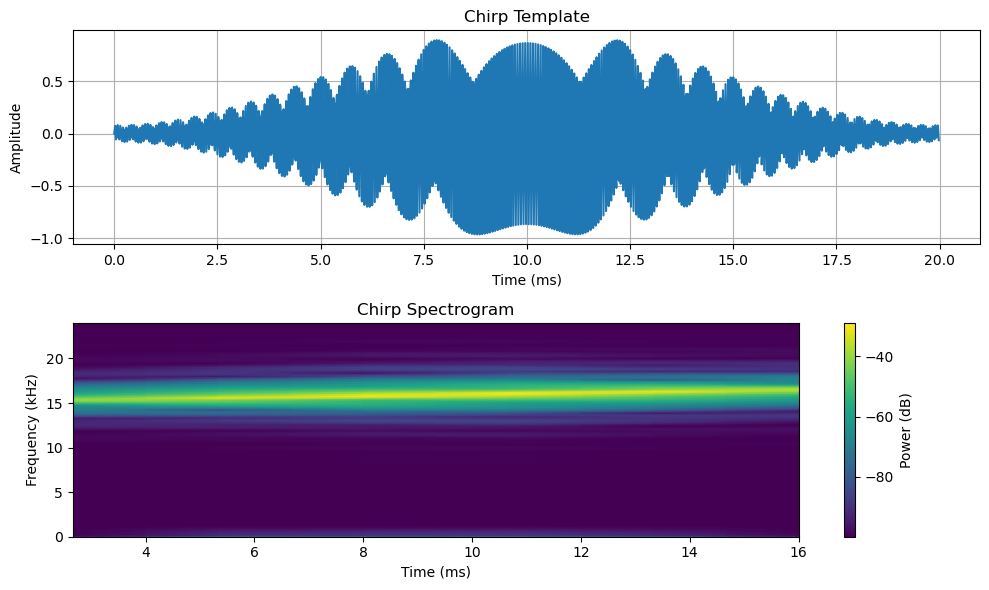

Applied bandpass filter (15000-17000 Hz)


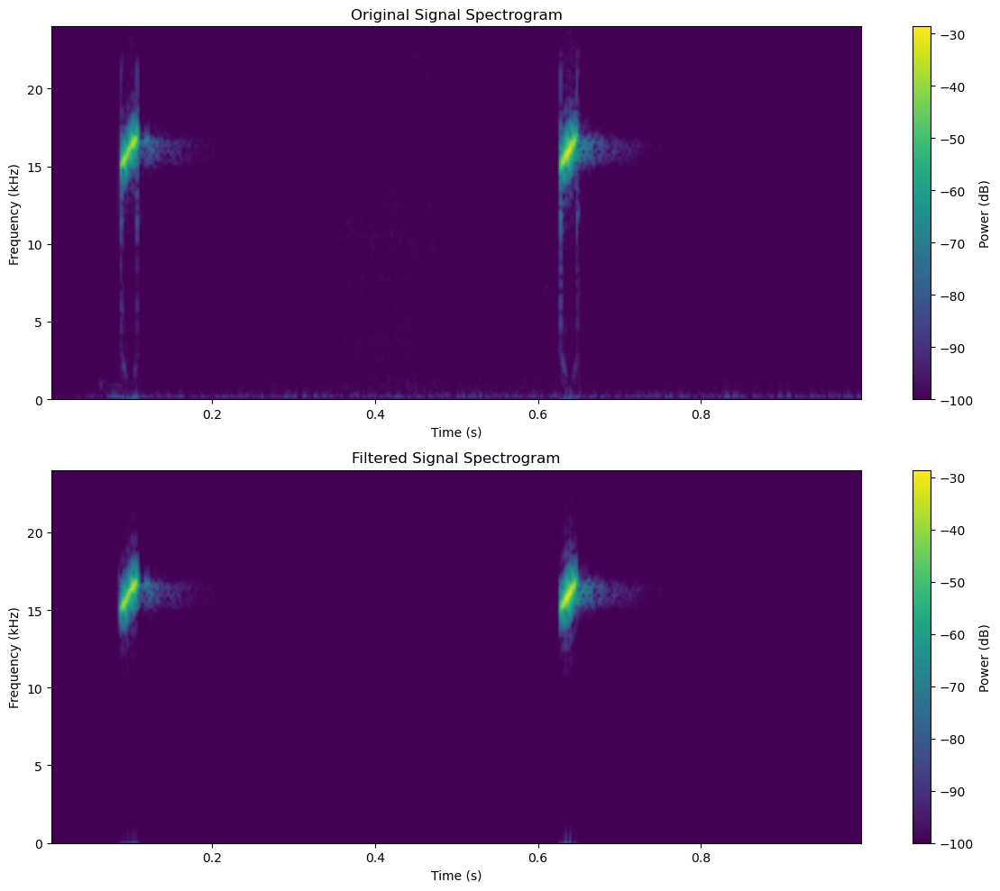

Detected 19 chirps using threshold 4.5167


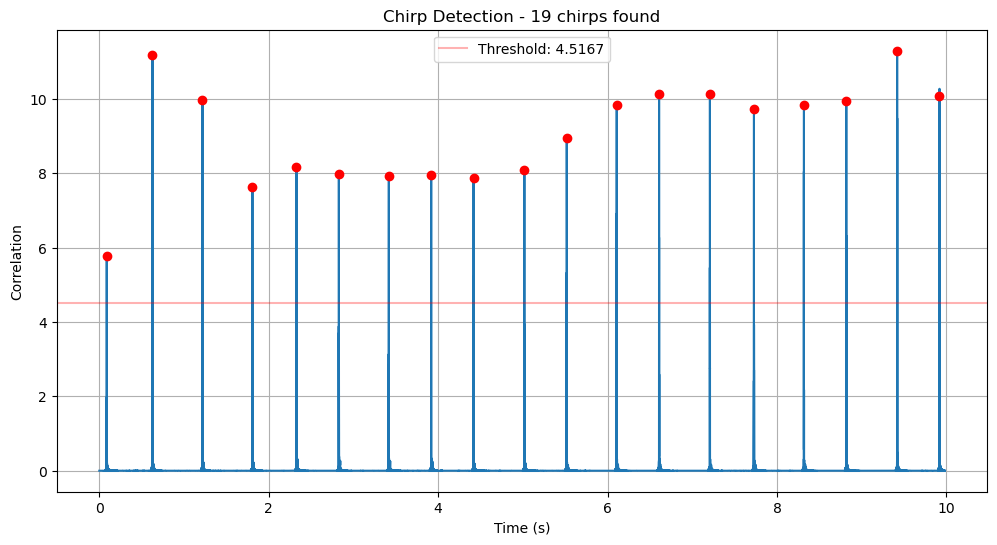

Extracted 19 profiles of 4800 samples each


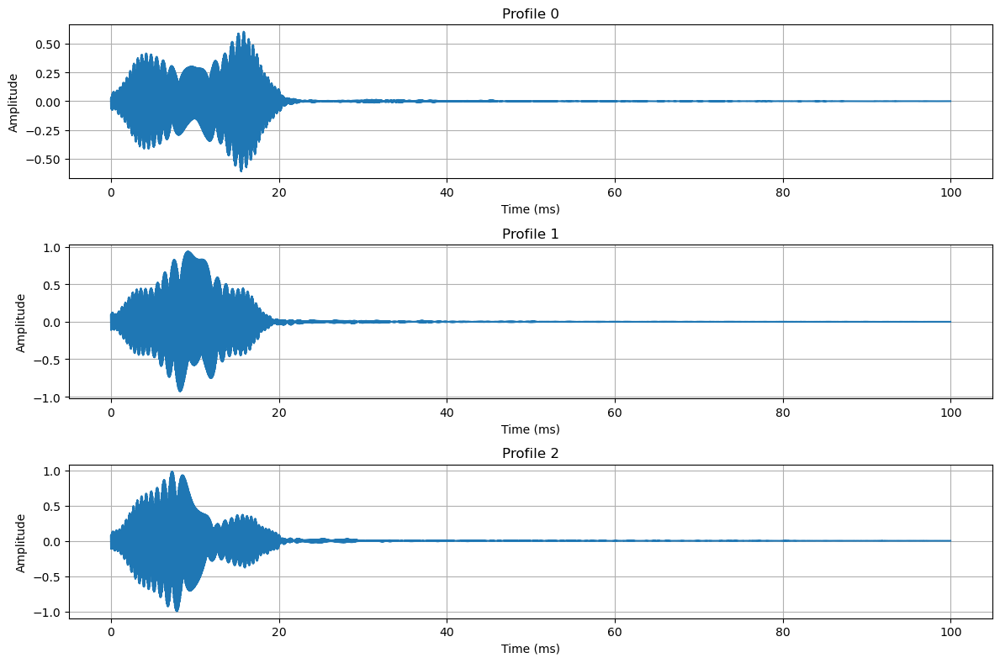

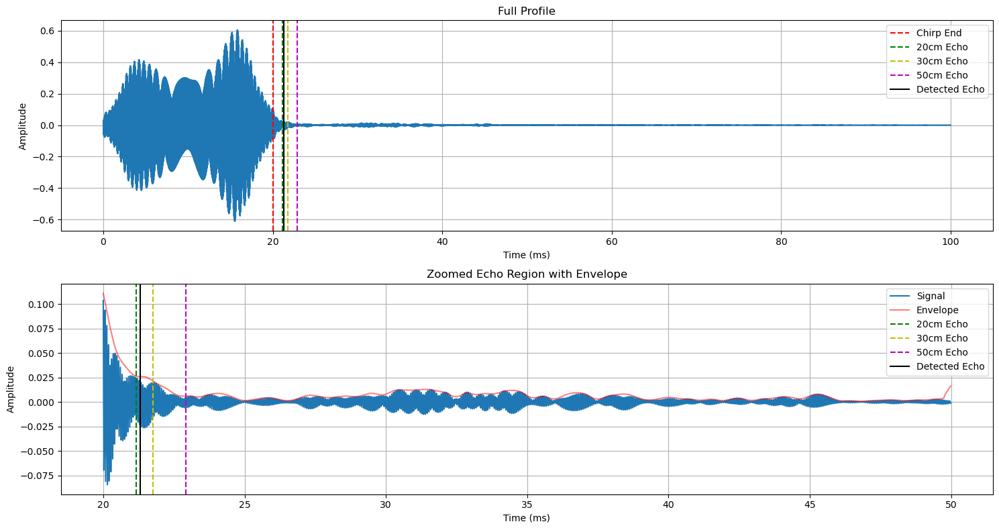

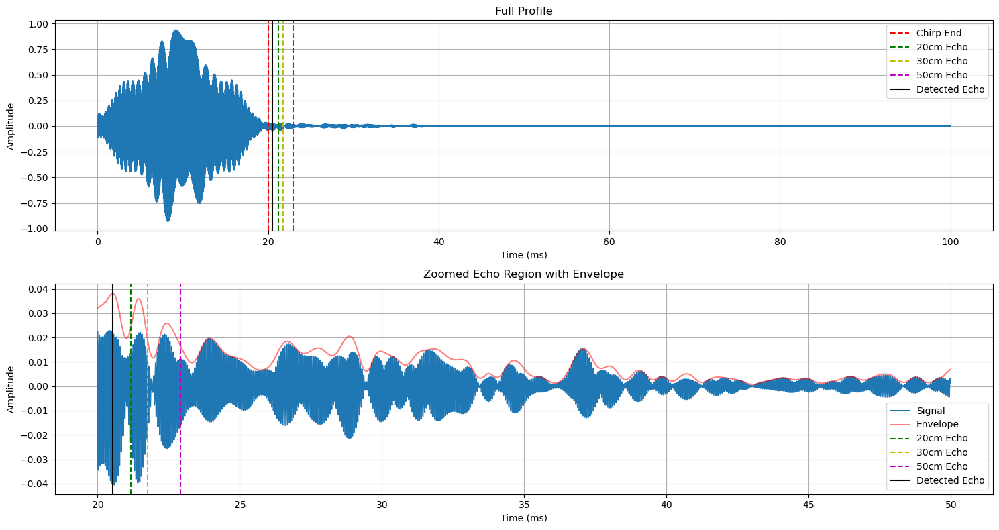

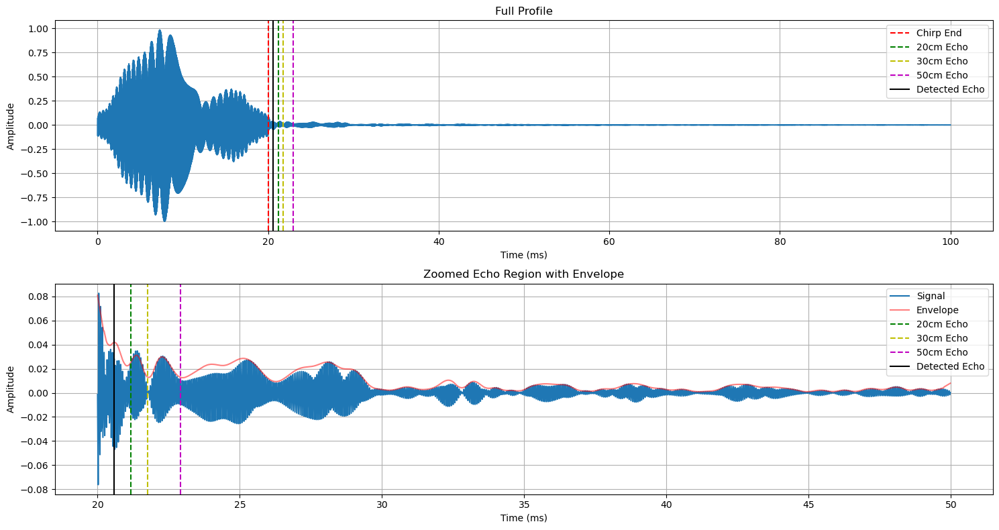

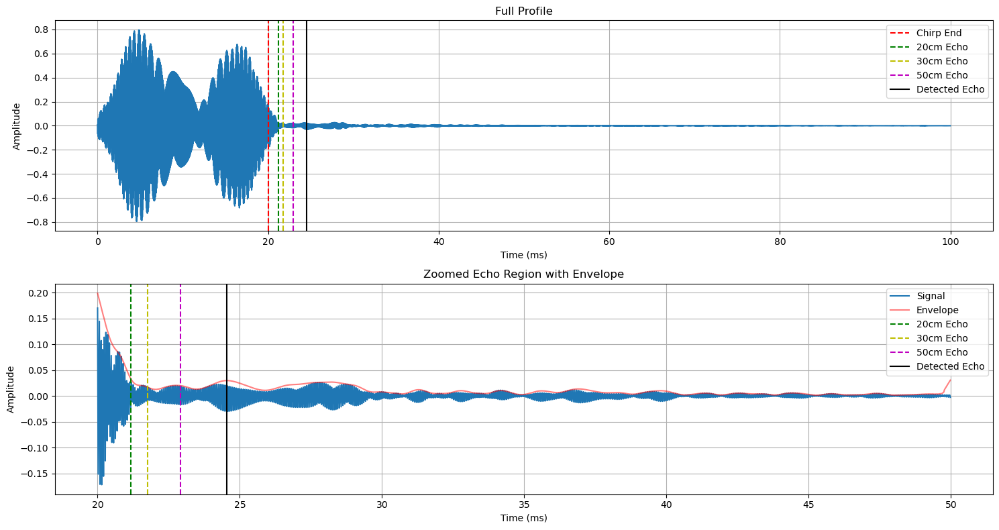

...

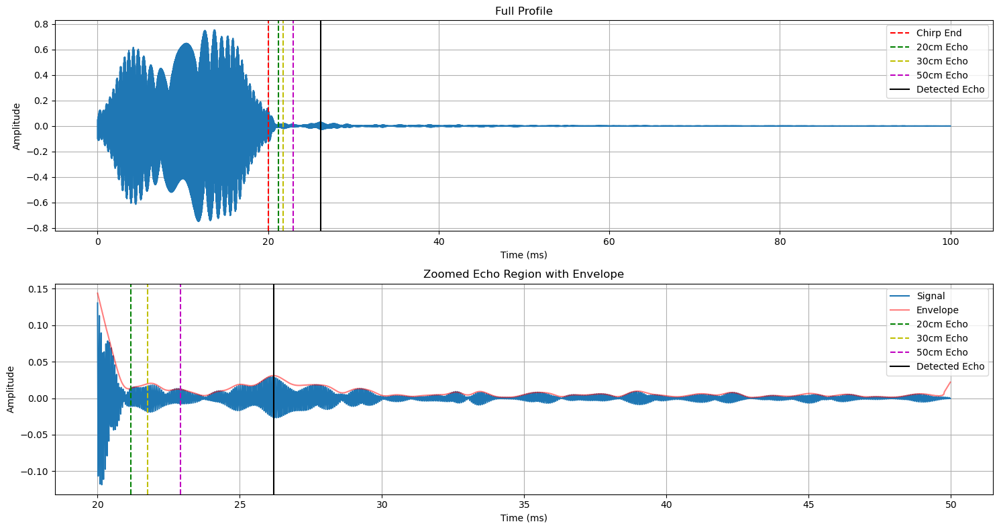

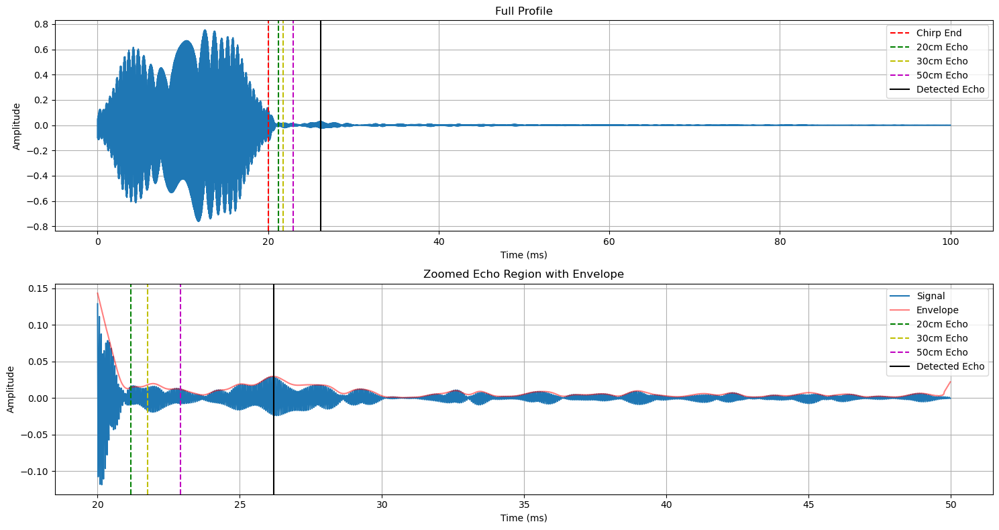

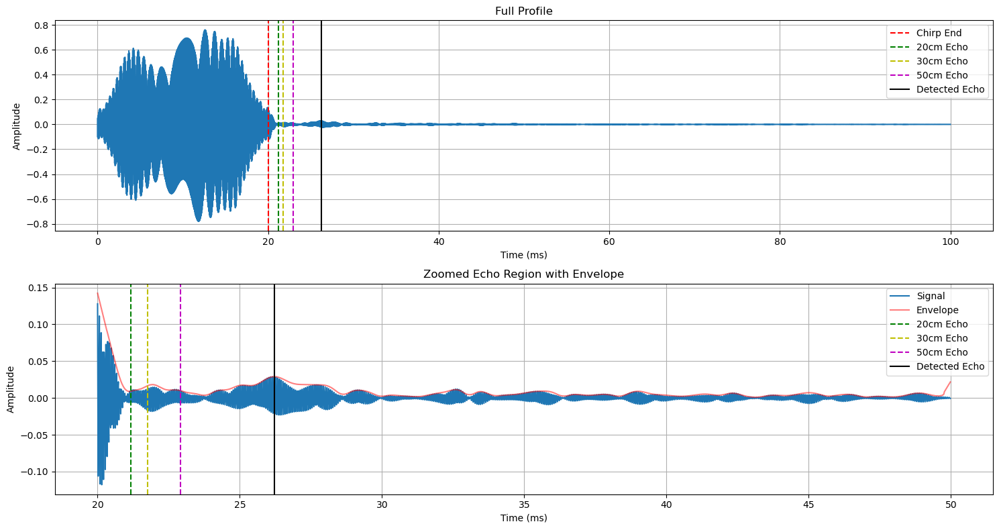

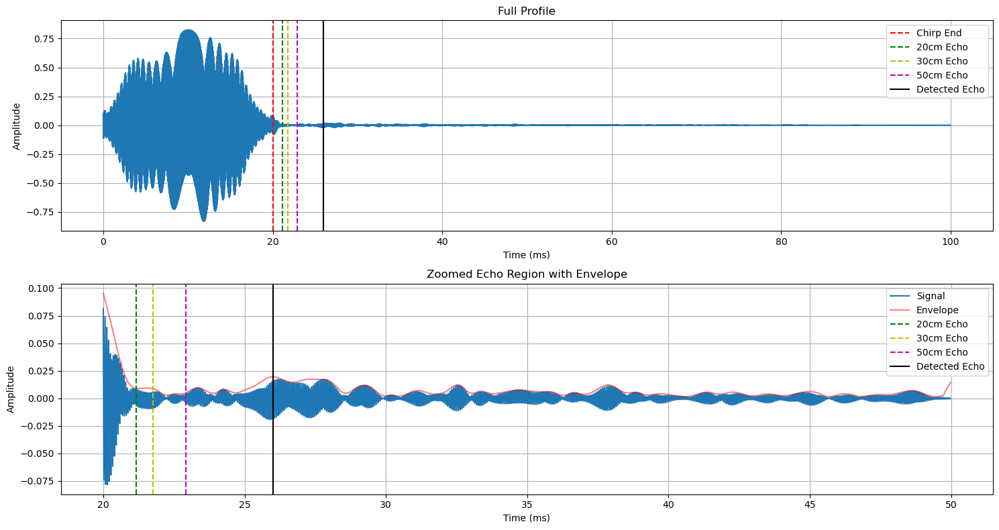

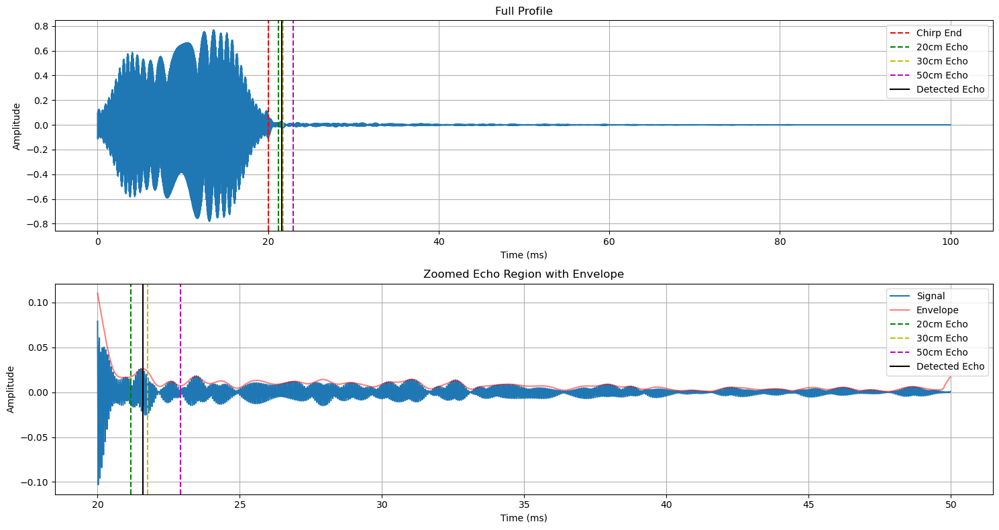


Distance measurement results:
Mean distance: 50.34 cm
Median distance: 25.72 cm
Std deviation: 41.20 cm
Min distance: 8.93 cm
Max distance: 107.19 cm


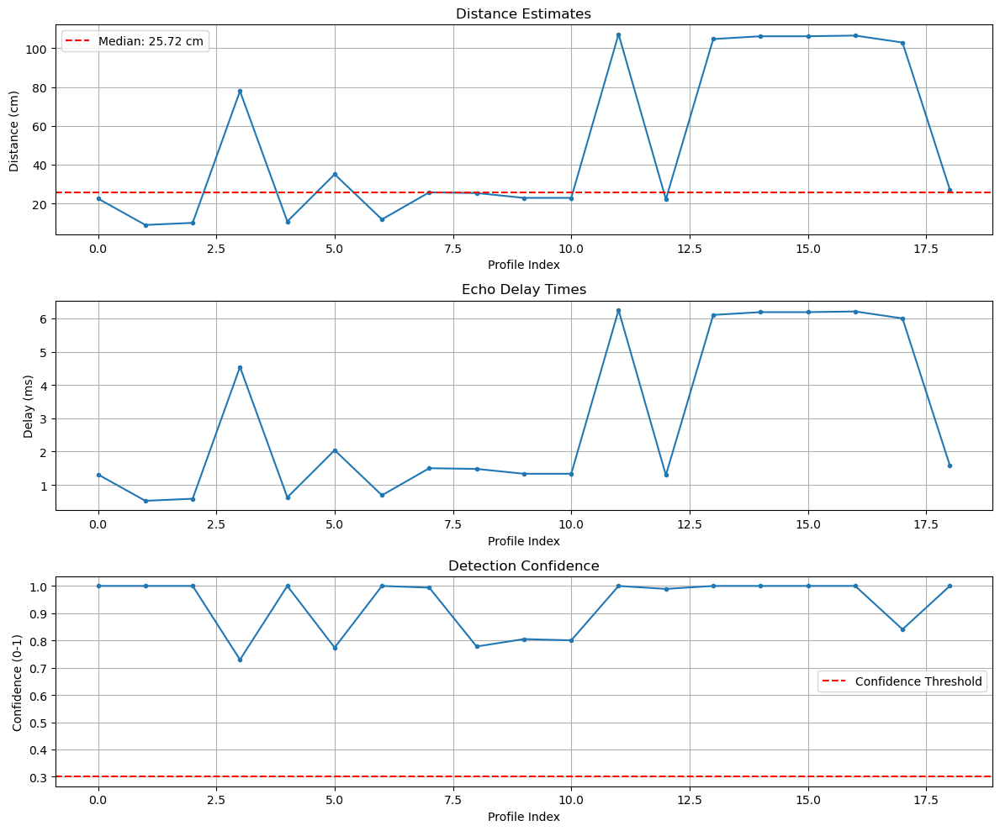

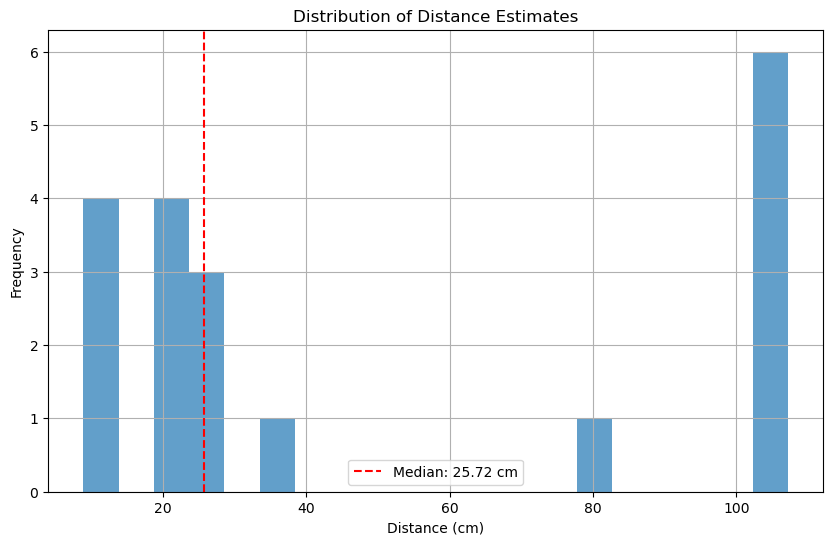


Summary:
file_name: recording.wav
num_samples: 480000
sample_rate: 48000
num_chirps_detected: 19
num_profiles: 19
num_valid_profiles: 19
mean_distance_cm: 50.34
median_distance_cm: 25.72
std_dev_cm: 41.20
min_distance_cm: 8.93
max_distance_cm: 107.19

Results saved to D5_ipad_20/echo_detection_results.csv

Analysis complete!


In [41]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
import os
import glob
import pandas as pd
from pathlib import Path

# Add alternative audio loading libraries
try:
    import librosa
    HAS_LIBROSA = True
except ImportError:
    HAS_LIBROSA = False
    print("librosa not found. Will use scipy.io.wavfile only (limited format support).")
    print("Consider installing librosa for broader audio format support: pip install librosa")

# Configuration parameters - updated to match your Java implementation
CONFIG = {
    'chirp_min_freq': 15000,      # Hz - match Java implementation
    'chirp_max_freq': 17000,      # Hz - match Java implementation
    'chirp_duration_ms': 20,      # ms - match Java implementation (EchoTester.java)
    'speed_of_sound': 343,        # m/s
    'search_window_start': 0.0,   # ms - start search immediately after chirp
    'search_window_end': 30.0,    # ms - extend to capture echoes seen in your images
    'chirp_gap_ms': 500,          # ms - gap between chirps (from Java code)
    'plot_results': True,         # Set to True to visualize results
    'debug_mode': True            # Enable detailed debug output
}

class EchoValidator:
    """Class for validating echo detection in acoustic sensing data"""
    
    def __init__(self, config):
        """Initialize with configuration parameters"""
        self.config = config
        self.sample_rate = None
        self.chirp_template = None
    
    def generate_chirp_template(self, sample_rate):
        """Generate chirp template based on configuration"""
        self.sample_rate = sample_rate
        
        # Calculate chirp parameters
        chirp_samples = int(sample_rate * self.config['chirp_duration_ms'] / 1000.0)
        chirp_rate = (self.config['chirp_max_freq'] - self.config['chirp_min_freq']) / (self.config['chirp_duration_ms'] / 1000.0)
        
        # Generate time vector
        t = np.arange(chirp_samples) / sample_rate
        
        # Apply Hamming window
        window = np.hamming(chirp_samples)
        
        # Generate linear chirp
        phase = 2 * np.pi * (self.config['chirp_min_freq'] * t + 0.5 * chirp_rate * t * t)
        amplitude = window  # Normalized amplitude
        self.chirp_template = amplitude * np.sin(phase)
        
        if self.config['debug_mode']:
            print(f"Generated chirp template: {len(self.chirp_template)} samples")
            print(f"Chirp frequency range: {self.config['chirp_min_freq']}-{self.config['chirp_max_freq']} Hz")
            print(f"Chirp duration: {self.config['chirp_duration_ms']} ms")
            
            if self.config['plot_results']:
                plt.figure(figsize=(10, 6))
                plt.subplot(2, 1, 1)
                plt.plot(t * 1000, self.chirp_template)  # Time in ms
                plt.title("Chirp Template")
                plt.xlabel("Time (ms)")
                plt.ylabel("Amplitude")
                plt.grid(True)
                
                plt.subplot(2, 1, 2)
                f, t, Sxx = signal.spectrogram(self.chirp_template, sample_rate, nperseg=256, noverlap=128)
                plt.pcolormesh(t * 1000, f / 1000, 10 * np.log10(Sxx + 1e-10), shading='gouraud')
                plt.title("Chirp Spectrogram")
                plt.ylabel('Frequency (kHz)')
                plt.xlabel('Time (ms)')
                plt.colorbar(label='Power (dB)')
                plt.tight_layout()
                plt.show()
        
        return self.chirp_template
    
    def apply_bandpass_filter(self, audio_data):
        """Apply bandpass filter to isolate the chirp frequency range"""
        nyquist = self.sample_rate / 2
        low = self.config['chirp_min_freq'] / nyquist
        high = self.config['chirp_max_freq'] / nyquist
        
        # Use an 4th order Butterworth filter - reduced order for stability
        b, a = signal.butter(4, [low, high], btype='band')
        filtered_data = signal.filtfilt(b, a, audio_data)
        
        if self.config['debug_mode']:
            print(f"Applied bandpass filter ({self.config['chirp_min_freq']}-{self.config['chirp_max_freq']} Hz)")
            
            if self.config['plot_results']:
                # Create before/after spectrogram
                plt.figure(figsize=(12, 10))
                
                # Before filtering
                plt.subplot(2, 1, 1)
                f, t, Sxx = signal.spectrogram(audio_data[:min(len(audio_data), 48000)], 
                                              self.sample_rate, nperseg=256, noverlap=128)
                plt.pcolormesh(t, f / 1000, 10 * np.log10(Sxx + 1e-10), shading='gouraud')
                plt.title("Original Signal Spectrogram")
                plt.ylabel('Frequency (kHz)')
                plt.xlabel('Time (s)')
                plt.colorbar(label='Power (dB)')
                
                # After filtering
                plt.subplot(2, 1, 2)
                f, t, Sxx = signal.spectrogram(filtered_data[:min(len(filtered_data), 48000)], 
                                              self.sample_rate, nperseg=256, noverlap=128)
                plt.pcolormesh(t, f / 1000, 10 * np.log10(Sxx + 1e-10), shading='gouraud')
                plt.title("Filtered Signal Spectrogram")
                plt.ylabel('Frequency (kHz)')
                plt.xlabel('Time (s)')
                plt.colorbar(label='Power (dB)')
                
                plt.tight_layout()
                plt.show()
        
        return filtered_data
    
    def detect_chirps(self, audio_data, threshold=0.4):
        """
        Detect chirps in the audio data with improved robustness
        
        Args:
            audio_data: Audio signal
            threshold: Detection threshold (0-1, or negative for automatic)
            
        Returns:
            List of detected chirp start positions (in samples)
        """
        # Use cross-correlation with the chirp template
        correlation = signal.correlate(audio_data, self.chirp_template, mode='valid')
        
        # Normalize correlation properly
        norm_factor = np.sqrt(np.sum(self.chirp_template**2))
        if norm_factor > 0:
            correlation = correlation / norm_factor
        
        # Take absolute value for peak detection
        abs_corr = np.abs(correlation)
        
        # Set threshold based on correlation statistics
        if threshold <= 0:
            # Automatic threshold
            threshold = np.mean(abs_corr) + 3 * np.std(abs_corr)
        else:
            # Scale threshold based on max correlation
            threshold = threshold * np.max(abs_corr)
        
        # Minimum distance between chirps based on config
        min_distance = int(self.sample_rate * self.config['chirp_gap_ms'] / 1000)
        
        # Find peaks
        peaks, _ = signal.find_peaks(abs_corr, height=threshold, distance=min_distance)
        
        if len(peaks) == 0:
            print("WARNING: No chirps detected! Lowering threshold and trying again...")
            # Try again with lower threshold
            threshold = threshold / 2
            peaks, _ = signal.find_peaks(abs_corr, height=threshold, distance=min_distance)
            
            if len(peaks) == 0 and self.config['debug_mode']:
                # If still no peaks, show correlation for debugging
                plt.figure(figsize=(12, 6))
                plt.plot(abs_corr)
                plt.axhline(y=threshold, color='r', linestyle='-', label=f'Threshold: {threshold:.4f}')
                plt.title("Correlation (No peaks detected)")
                plt.xlabel("Sample")
                plt.ylabel("Correlation")
                plt.legend()
                plt.grid(True)
                plt.show()
        
        if self.config['debug_mode']:
            print(f"Detected {len(peaks)} chirps using threshold {threshold:.4f}")
            
            if self.config['plot_results'] and len(peaks) > 0:
                plt.figure(figsize=(12, 6))
                t = np.arange(len(correlation)) / self.sample_rate
                plt.plot(t, abs_corr)
                plt.plot(t[peaks], abs_corr[peaks], 'ro')
                plt.axhline(y=threshold, color='r', linestyle='-', alpha=0.3, label=f'Threshold: {threshold:.4f}')
                plt.title(f"Chirp Detection - {len(peaks)} chirps found")
                plt.xlabel("Time (s)")
                plt.ylabel("Correlation")
                plt.legend()
                plt.grid(True)
                plt.show()
        
        return peaks
    
    def extract_profiles(self, audio_data, chirp_positions, profile_duration_ms=100):
        """
        Extract profiles around each chirp
        
        Args:
            audio_data: Audio signal
            chirp_positions: List of chirp positions in samples
            profile_duration_ms: Duration of each profile in ms
            
        Returns:
            List of profiles (numpy arrays)
        """
        profiles = []
        samples_per_profile = int(self.sample_rate * profile_duration_ms / 1000)
        
        for pos in chirp_positions:
            # Extract profile ensuring we don't go out of bounds
            end_pos = min(pos + samples_per_profile, len(audio_data))
            if end_pos - pos >= samples_per_profile / 2:  # At least half the profile length
                profile = audio_data[pos:end_pos]
                # Pad if needed
                if len(profile) < samples_per_profile:
                    profile = np.pad(profile, (0, samples_per_profile - len(profile)), 'constant')
                profiles.append(profile)
        
        if self.config['debug_mode']:
            print(f"Extracted {len(profiles)} profiles of {samples_per_profile} samples each")
            
            if self.config['plot_results'] and profiles:
                # Plot a few example profiles
                num_to_plot = min(3, len(profiles))
                plt.figure(figsize=(12, 8))
                
                for i in range(num_to_plot):
                    plt.subplot(num_to_plot, 1, i+1)
                    t = np.arange(len(profiles[i])) / self.sample_rate * 1000  # Time in ms
                    plt.plot(t, profiles[i])
                    plt.title(f"Profile {i}")
                    plt.xlabel("Time (ms)")
                    plt.ylabel("Amplitude")
                    plt.grid(True)
                plt.tight_layout()
                plt.show()
        
        return profiles
    
    def detect_echo(self, profile):
        """
        Detect echo in a single profile with improved sensitivity
        
        Args:
            profile: Single profile array
            
        Returns:
            delay_time: Time delay in seconds
            distance: Estimated distance in cm
            confidence: Detection confidence (0-1)
        """
        # Chirp duration in samples
        chirp_end = int(self.config['chirp_duration_ms'] * self.sample_rate / 1000)
        
        # Define search window in samples (relative to chirp end)
        search_start = chirp_end + int(self.config['search_window_start'] * self.sample_rate / 1000)
        search_end = chirp_end + int(self.config['search_window_end'] * self.sample_rate / 1000)
        
        # Ensure search bounds are valid
        search_start = max(0, search_start)
        search_end = min(search_end, len(profile))
        
        if search_end <= search_start + 10 or search_end >= len(profile):
            # Invalid search window or too small window
            return 0, 0, 0
            
        # Focus on the search window
        search_region = profile[search_start:search_end]
        
        # Apply envelope detection for better sensitivity
        analytic_signal = signal.hilbert(search_region)
        amplitude_envelope = np.abs(analytic_signal)
        
        # Smooth the envelope
        window_size = min(21, len(amplitude_envelope) - 1)
        if window_size > 2:  # Need at least 3 points for smoothing
            window_size = window_size if window_size % 2 == 1 else window_size - 1  # Ensure odd window size
            amplitude_envelope = signal.savgol_filter(amplitude_envelope, window_size, 1)
        
        # Find peaks in the envelope with appropriate threshold
        peak_indices, _ = signal.find_peaks(amplitude_envelope, 
                                          height=np.mean(amplitude_envelope)*1.2,
                                          distance=self.sample_rate//1000)  # At least 1ms between peaks
        
        if len(peak_indices) == 0:
            # If no clear peaks, use the maximum value point
            peak_idx = np.argmax(amplitude_envelope)
        else:
            # Use the first strong peak (earliest echo)
            peak_values = amplitude_envelope[peak_indices]
            max_value = np.max(peak_values)
            strong_peaks = peak_indices[peak_values > max_value * 0.7]
            peak_idx = strong_peaks[0] if len(strong_peaks) > 0 else peak_indices[0]
        
        # Calculate time delay from chirp end to echo
        echo_samples = peak_idx  # Relative to search_start
        delay_samples = search_start + echo_samples  # Absolute sample position
        
        # Calculate echo delay time (seconds) RELATIVE TO CHIRP END
        echo_delay = (delay_samples - chirp_end) / self.sample_rate
        
        # Calculate distance (divide by 2 for round trip)
        distance = self.config['speed_of_sound'] * echo_delay * 100 / 2  # cm
        
        # Calculate confidence based on peak strength
        if len(amplitude_envelope) > 0:
            peak_value = amplitude_envelope[peak_idx]
            mean_value = np.mean(amplitude_envelope)
            if mean_value > 0:
                snr = peak_value / mean_value
                confidence = min(1.0, snr / 3)  # Scale to 0-1, cap at 1.0
            else:
                confidence = 0.5
        else:
            confidence = 0
        
        # Visualize the echo detection (optional)
        if self.config['debug_mode'] and self.config['plot_results']:
            self.debug_echo_detection(profile, delay_samples)
        
        return echo_delay, distance, confidence
    
    def debug_echo_detection(self, profile, detected_echo_sample):
        """Visualize the echo detection process with enhanced detail"""
        # Time in milliseconds
        t = np.arange(len(profile)) / self.sample_rate * 1000
        
        # Chirp end point (in samples)
        chirp_end = int(self.config['chirp_duration_ms'] * self.sample_rate / 1000)
        
        # Expected time regions for different distances
        distances = [20, 30, 50]
        echo_times = {}
        for dist in distances:
            # Calculate expected echo time: chirp duration + round trip time + small adjustment
            echo_times[dist] = self.config['chirp_duration_ms'] + (2 * dist / (self.config['speed_of_sound'] * 100) * 1000)
        
        plt.figure(figsize=(15, 8))
        
        # Plot full profile
        plt.subplot(2, 1, 1)
        plt.plot(t, profile)
        plt.axvline(x=self.config['chirp_duration_ms'], color='r', linestyle='--', label='Chirp End')
        
        for dist, echo_time in echo_times.items():
            plt.axvline(x=echo_time, color=['g', 'y', 'm'][distances.index(dist) % 3], 
                       linestyle='--', label=f'{dist}cm Echo')
        
        if detected_echo_sample > 0:
            detected_time = detected_echo_sample / self.sample_rate * 1000
            plt.axvline(x=detected_time, color='k', linestyle='-', label='Detected Echo')
        
        plt.title("Full Profile")
        plt.xlabel("Time (ms)")
        plt.ylabel("Amplitude")
        plt.legend()
        plt.grid(True)
        
        # Plot zoomed echo region with amplitude enhancement
        plt.subplot(2, 1, 2)
        search_start = chirp_end
        search_end = min(chirp_end + int(self.config['search_window_end'] * self.sample_rate / 1000), len(profile))
        
        if search_end > search_start:
            echo_region = profile[search_start:search_end]
            echo_t = t[search_start:search_end]
            
            # Apply envelope detection
            analytic_signal = signal.hilbert(echo_region)
            amplitude_envelope = np.abs(analytic_signal)
            
            # Smooth envelope
            window_size = min(21, len(amplitude_envelope) - 1)
            if window_size > 2 and window_size % 2 == 1:
                amplitude_envelope = signal.savgol_filter(amplitude_envelope, window_size, 1)
            
            # Plot both the signal and its envelope
            plt.plot(echo_t, echo_region, label='Signal')
            plt.plot(echo_t, amplitude_envelope, 'r-', label='Envelope', alpha=0.5)
            
            # Plot expected echo times
            for dist, echo_time in echo_times.items():
                if echo_time >= np.min(echo_t) and echo_time <= np.max(echo_t):
                    plt.axvline(x=echo_time, color=['g', 'y', 'm'][distances.index(dist) % 3], 
                               linestyle='--', label=f'{dist}cm Echo')
            
            if detected_echo_sample > 0:
                detected_time = detected_echo_sample / self.sample_rate * 1000
                if detected_time >= np.min(echo_t) and detected_time <= np.max(echo_t):
                    plt.axvline(x=detected_time, color='k', linestyle='-', label='Detected Echo')
            
            plt.title("Zoomed Echo Region with Envelope")
            plt.xlabel("Time (ms)")
            plt.ylabel("Amplitude")
            plt.legend()
            plt.grid(True)
        
        plt.tight_layout()
        plt.show()
    
    def analyze_profiles(self, profiles):
        """
        Analyze multiple profiles to estimate distance
        
        Args:
            profiles: List of profiles
            
        Returns:
            DataFrame with results for each profile
        """
        results = []
        
        for i, profile in enumerate(profiles):
            delay_time, distance, confidence = self.detect_echo(profile)
            results.append({
                'profile_idx': i,
                'delay_time_ms': delay_time * 1000,
                'distance_cm': distance,
                'confidence': confidence
            })
        
        results_df = pd.DataFrame(results)
        
        # Filter results based on confidence
        valid_results = results_df[results_df['confidence'] > 0.3]
        
        if self.config['debug_mode']:
            print("\nDistance measurement results:")
            if not valid_results.empty:
                print(f"Mean distance: {valid_results['distance_cm'].mean():.2f} cm")
                print(f"Median distance: {valid_results['distance_cm'].median():.2f} cm")
                print(f"Std deviation: {valid_results['distance_cm'].std():.2f} cm")
                print(f"Min distance: {valid_results['distance_cm'].min():.2f} cm")
                print(f"Max distance: {valid_results['distance_cm'].max():.2f} cm")
            else:
                print("No valid distance measurements (confidence too low)")
            
            if self.config['plot_results'] and not results_df.empty:
                plt.figure(figsize=(12, 10))
                
                # Plot distance estimates
                plt.subplot(3, 1, 1)
                plt.plot(results_df['profile_idx'], results_df['distance_cm'], '.-')
                if not valid_results.empty:
                    plt.axhline(y=valid_results['distance_cm'].median(), 
                               color='r', linestyle='--', 
                               label=f"Median: {valid_results['distance_cm'].median():.2f} cm")
                plt.title("Distance Estimates")
                plt.xlabel("Profile Index")
                plt.ylabel("Distance (cm)")
                plt.legend()
                plt.grid(True)
                
                # Plot delay times
                plt.subplot(3, 1, 2)
                plt.plot(results_df['profile_idx'], results_df['delay_time_ms'], '.-')
                plt.title("Echo Delay Times")
                plt.xlabel("Profile Index")
                plt.ylabel("Delay (ms)")
                plt.grid(True)
                
                # Plot confidence
                plt.subplot(3, 1, 3)
                plt.plot(results_df['profile_idx'], results_df['confidence'], '.-')
                plt.axhline(y=0.3, color='r', linestyle='--', label="Confidence Threshold")
                plt.title("Detection Confidence")
                plt.xlabel("Profile Index")
                plt.ylabel("Confidence (0-1)")
                plt.legend()
                plt.grid(True)
                
                plt.tight_layout()
                plt.show()
                
                # Plot histogram of distance estimates (only for valid results)
                if not valid_results.empty:
                    plt.figure(figsize=(10, 6))
                    plt.hist(valid_results['distance_cm'], bins=20, alpha=0.7)
                    plt.axvline(x=valid_results['distance_cm'].median(), 
                               color='r', linestyle='--', 
                               label=f"Median: {valid_results['distance_cm'].median():.2f} cm")
                    plt.title("Distribution of Distance Estimates")
                    plt.xlabel("Distance (cm)")
                    plt.ylabel("Frequency")
                    plt.legend()
                    plt.grid(True)
                    plt.show()
        
        return results_df
    
    def analyze_recording(self, file_path, expected_distance=None):
        """
        Analyze a complete recording file
        
        Args:
            file_path: Path to audio file
            expected_distance: Expected distance in cm (if known)
            
        Returns:
            Dictionary with analysis results
        """
        print(f"\nAnalyzing file: {os.path.basename(file_path)}")
        
        try:
            # Try multiple methods to load the audio file
            audio_loaded = False
            
            # Method 1: Try standard wavfile.read
            try:
                sample_rate, audio_data = wavfile.read(file_path)
                audio_loaded = True
                print(f"Loaded audio using scipy.io.wavfile: {len(audio_data)} samples at {sample_rate} Hz")
            except Exception as e:
                print(f"Could not load with scipy.io.wavfile: {str(e)}")
            
            # Method 2: Try librosa if available
            if not audio_loaded and HAS_LIBROSA:
                try:
                    audio_data, sample_rate = librosa.load(file_path, sr=None, mono=True)
                    audio_loaded = True
                    print(f"Loaded audio using librosa: {len(audio_data)} samples at {sample_rate} Hz")
                except Exception as e:
                    print(f"Could not load with librosa: {str(e)}")
            
            # Method 3: Try reading as raw PCM data
            if not audio_loaded:
                try:
                    print("Attempting to read as raw PCM data...")
                    # For direct PCM reading, we need to assume some parameters
                    sample_rate = 48000
                    try:
                        # First try with 16-bit signed integer
                        with open(file_path, 'rb') as f:
                            audio_bytes = f.read()
                            
                        # Check if it's a WAV file by looking at header
                        if audio_bytes[:4] == b'RIFF' and audio_bytes[8:12] == b'WAVE':
                            print("File appears to be a WAV file but couldn't be read correctly")
                            # Skip the header
                            audio_data = np.frombuffer(audio_bytes[44:], dtype=np.int16)
                        else:
                            audio_data = np.frombuffer(audio_bytes, dtype=np.int16)
                        
                        audio_loaded = True
                        print(f"Loaded audio as raw PCM data: {len(audio_data)} samples at {sample_rate} Hz (assumed)")
                    except Exception as e:
                        print(f"Could not load as int16 PCM: {str(e)}")
                        
                        # Try with 32-bit float format
                        try:
                            with open(file_path, 'rb') as f:
                                audio_bytes = f.read()
                            audio_data = np.frombuffer(audio_bytes, dtype=np.float32)
                            audio_loaded = True
                            print(f"Loaded audio as float32 PCM: {len(audio_data)} samples at {sample_rate} Hz (assumed)")
                        except Exception as e:
                            print(f"Could not load as float32 PCM: {str(e)}")
                except Exception as e:
                    print(f"Could not load as raw PCM: {str(e)}")
            
            if not audio_loaded:
                raise ValueError("Could not load audio file with any available method")
            
            # Convert to mono if stereo
            if len(audio_data.shape) > 1:
                print(f"Converting {audio_data.shape[1]} channels to mono")
                audio_data = audio_data[:, 0]  # Use the first channel
            
            # Check for valid data
            if np.all(audio_data == 0):
                raise ValueError("Audio data contains only zeros")
            
            if np.isnan(audio_data).any():
                raise ValueError("Audio data contains NaN values")
            
            # Normalize to float in range -1 to 1
            audio_data = audio_data.astype(float)
            max_val = np.max(np.abs(audio_data))
            if max_val > 0:
                audio_data = audio_data / max_val
            
            # Generate chirp template if needed
            if self.chirp_template is None or self.sample_rate != sample_rate:
                self.generate_chirp_template(sample_rate)
            
            # Apply bandpass filter
            filtered_audio = self.apply_bandpass_filter(audio_data)
            
            # Detect chirps
            chirp_positions = self.detect_chirps(filtered_audio)
            
            if not isinstance(chirp_positions, np.ndarray) or chirp_positions.size == 0:
                print("No chirps detected in the recording")
                return {
                    'file_name': os.path.basename(file_path),
                    'error': 'No chirps detected',
                    'num_profiles': 0
                }
            
            # Extract profiles
            profiles = self.extract_profiles(filtered_audio, chirp_positions)
            
            if not profiles:
                print("No valid profiles extracted")
                return {
                    'file_name': os.path.basename(file_path),
                    'error': 'No valid profiles extracted',
                    'num_profiles': 0
                }
            
            # Analyze profiles
            results_df = self.analyze_profiles(profiles)
            
            # Filter results based on confidence
            valid_results = results_df[results_df['confidence'] > 0.3]
            
            # Calculate error metrics if we have valid results
            if not valid_results.empty and expected_distance is not None:
                error = valid_results['distance_cm'] - expected_distance
                valid_results['error_cm'] = error
                
                print("\nError metrics:")
                print(f"Mean error: {error.mean():.2f} cm")
                print(f"Median error: {error.median():.2f} cm")
                print(f"Mean absolute error: {error.abs().mean():.2f} cm")
                print(f"Root mean square error: {np.sqrt((error**2).mean()):.2f} cm")
                
                if self.config['plot_results']:
                    plt.figure(figsize=(10, 6))
                    plt.plot(valid_results['profile_idx'], error, '.-')
                    plt.axhline(y=0, color='r', linestyle='--')
                    plt.title(f"Distance Error (Expected: {expected_distance} cm)")
                    plt.xlabel("Profile Index")
                    plt.ylabel("Error (cm)")
                    plt.grid(True)
                    plt.show()
            
            # Prepare summary results
            summary = {
                'file_name': os.path.basename(file_path),
                'num_samples': len(audio_data),
                'sample_rate': sample_rate,
                'num_chirps_detected': len(chirp_positions),
                'num_profiles': len(profiles),
                'num_valid_profiles': len(valid_results) if not results_df.empty else 0
            }
            
            # Add distance statistics if we have valid results
            if not valid_results.empty:
                summary.update({
                    'mean_distance_cm': valid_results['distance_cm'].mean(),
                    'median_distance_cm': valid_results['distance_cm'].median(),
                    'std_dev_cm': valid_results['distance_cm'].std(),
                    'min_distance_cm': valid_results['distance_cm'].min(),
                    'max_distance_cm': valid_results['distance_cm'].max()
                })
            else:
                summary.update({
                    'mean_distance_cm': None,
                    'median_distance_cm': None,
                    'std_dev_cm': None,
                    'min_distance_cm': None,
                    'max_distance_cm': None
                })
            
            # Add error metrics if expected distance was provided
            if not valid_results.empty and expected_distance is not None:
                summary.update({
                    'expected_distance_cm': expected_distance,
                    'mean_error_cm': error.mean(),
                    'median_error_cm': error.median(),
                    'mean_abs_error_cm': error.abs().mean(),
                    'rmse_cm': np.sqrt((error**2).mean())
                })
            elif expected_distance is not None:
                summary.update({
                    'expected_distance_cm': expected_distance,
                    'mean_error_cm': None,
                    'median_error_cm': None,
                    'mean_abs_error_cm': None,
                    'rmse_cm': None
                })
            
            print("\nSummary:")
            for key, value in summary.items():
                if isinstance(value, (int, float)) and value is not None:
                    if isinstance(value, float):
                        print(f"{key}: {value:.2f}")
                    else:
                        print(f"{key}: {value}")
                else:
                    print(f"{key}: {value}")
            
            return summary
            
        except Exception as e:
            print(f"Error analyzing file {file_path}: {str(e)}")
            import traceback
            traceback.print_exc()
            return {
                'file_name': os.path.basename(file_path),
                'error': str(e),
                'num_profiles': 0
            }

def analyze_single_file(file_path, expected_distance=None):
    """Analyze a single audio file with expected distance"""
    validator = EchoValidator(CONFIG)
    return validator.analyze_recording(file_path, expected_distance)

def batch_analyze_recordings(root_dir, distance_map=None, file_patterns=[".wav"]):
    """
    Analyze specific recordings in a directory
    
    Args:
        root_dir: Root directory containing recording files
        distance_map: Dictionary mapping file patterns to expected distances
        file_patterns: List of file extensions or patterns to process
    
    Returns:
        DataFrame with results for all recordings
    """
    validator = EchoValidator(CONFIG)
    results = []
    
    # Find files matching specified patterns
    all_audio_files = []
    for pattern in file_patterns:
        all_audio_files.extend(glob.glob(os.path.join(root_dir, f"*{pattern}")))
    
    if not all_audio_files:
        print(f"No matching audio files found in {root_dir}")
        return None
    
    print(f"Found {len(all_audio_files)} audio files to analyze")
    
    for audio_file in all_audio_files:
        file_name = os.path.basename(audio_file)
        expected_distance = None
        
        # Try to match with expected distance if map provided
        if distance_map:
            for pattern, distance in distance_map.items():
                if pattern in file_name:
                    expected_distance = distance
                    break
        
        # Analyze file
        result = validator.analyze_recording(audio_file, expected_distance)
        
        if result:
            results.append(result)
    
    # Combine results into a DataFrame
    if results:
        results_df = pd.DataFrame(results)
        
        # Save results to CSV
        output_path = os.path.join(root_dir, "echo_detection_results.csv")
        results_df.to_csv(output_path, index=False)
        print(f"\nResults saved to {output_path}")
        
        return results_df
    else:
        return None

def analyze_with_expected_distance(file_path, distance_cm):
    """Convenience function to analyze a single file with known distance"""
    print(f"Analyzing file: {file_path}")
    print(f"Expected distance: {distance_cm} cm")
    
    result = analyze_single_file(file_path, expected_distance=distance_cm)
    
    if result and 'median_distance_cm' in result and result['median_distance_cm'] is not None:
        print(f"\nMeasured distance: {result['median_distance_cm']:.2f} cm")
        if 'expected_distance_cm' in result:
            error = result['median_distance_cm'] - result['expected_distance_cm'] 
            print(f"Error: {error:.2f} cm ({error/result['expected_distance_cm']*100:.1f}%)")
    
    return result

def interactive_analysis():
    """Interactive analysis function"""
    print("SONDAR Echo Detection Validation Tool")
    print("------------------------------------")
    
    # Get recording directory
    dir_path = input("Enter the directory containing your recordings: ")
    if not os.path.isdir(dir_path):
        print(f"Directory not found: {dir_path}")
        return
    
    # Check for recordings
    audio_extensions = [".wav", ".pcm", ".raw"]
    all_audio_files = []
    
    for ext in audio_extensions:
        all_audio_files.extend(glob.glob(os.path.join(dir_path, f"*{ext}")))
    
    if not all_audio_files:
        print(f"No audio files found in {dir_path}")
        return
    
    print(f"Found {len(all_audio_files)} audio files in {dir_path}")
    
    # Ask about expected distances
    use_distances = input("Do you know the expected distances for each recording? (y/n): ").lower().startswith('y')
    
    if use_distances:
        distance_map = {}
        for i, audio_file in enumerate(all_audio_files):
            file_name = os.path.basename(audio_file)
            print(f"{i+1}. {file_name}")
            try:
                distance_input = input(f"   Expected distance (cm) for this recording (press Enter to skip): ")
                if distance_input.strip():
                    distance = float(distance_input)
                    distance_map[file_name] = distance
            except ValueError:
                print("   Skipping expected distance for this recording")
        
        # Run analysis
        print("\nRunning analysis...")
        results_df = batch_analyze_recordings(dir_path, distance_map)
    else:
        # Run analysis without expected distances
        print("\nRunning analysis without expected distances...")
        results_df = batch_analyze_recordings(dir_path)
    
    if results_df is not None:
        print("\nAnalysis complete!")
    else:
        print("No results to display")

if __name__ == "__main__":
    # Run the interactive analysis
    interactive_analysis()